In [312]:
! pip install seaborn

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip


In [313]:
import json
from collections import Counter
import numpy as np
import datetime
import pickle
from matplotlib import pyplot as plt
import torch
from torch.utils.data import DataLoader, Dataset
import pandas as pd
from tqdm import tqdm
import seaborn as sns
from sklearn.linear_model import LinearRegression
from warnings import filterwarnings
import os
from copy import deepcopy
filterwarnings("ignore")

In [314]:

def get_dataloader_forecasting(dataset_name, train_length, skip_length, valid_length=24*5, test_length =24*7, pred_length=24, history_length=168, batch_size=8, device='cuda:0'):
        """
        Prepares DataLoader objects for the forecasting datasets.
        
        Parameters:
        - dataset_name (str): The name of the dataset.
        - train_length, skip_length, valid_length, test_length, pred_length, history_length, batch_size (int): Various parameters defining dataset and DataLoader configurations.
        - device (str): The device to use for loading tensors.
        
        Returns:
        - Tuple[DataLoader, DataLoader, DataLoader, Tensor, Tensor]: Training, validation, and testing DataLoaders, along with scale and mean scale tensors used for normalization.
        """

        train_dataset = MyForecasting_Dataset(dataset_name, train_length, skip_length, valid_length, test_length, pred_length, history_length, is_train=1)
        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
        
        valid_dataset = MyForecasting_Dataset(dataset_name, train_length, skip_length, valid_length, test_length, pred_length, history_length, is_train=2)
        valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False)
        
        test_dataset = MyForecasting_Dataset(dataset_name, train_length, skip_length, valid_length, test_length, pred_length, history_length, is_train=0)
        test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
        
        predict_dataset = MyForecasting_Dataset(dataset_name, train_length, skip_length, valid_length, test_length, pred_length, history_length, is_train=3)
        predict_loader = DataLoader(predict_dataset, batch_size=batch_size, shuffle=False)


        # scaler = torch.from_numpy(train_dataset.std_data).to(device).float()
        scaler = torch.from_numpy(train_dataset.std_data.astype(np.float32)).to(device)
        mean_scaler = torch.from_numpy(train_dataset.mean_data.astype(np.float32)).to(device)
        all_indices = {
            split: list(train_dataset.main_data_raw.index[idx[0]]) for split, idx in train_dataset.tvt_indices.items()
        }
        df_indices = pd.DataFrame([
            [split, idx[0], idx[1]] for split, indices in all_indices.items()
            for idx in indices
            ], columns=['split', 'country', 'time_period']
        )
        raw_df = train_dataset.main_data_raw
        return train_loader, valid_loader, test_loader, scaler, mean_scaler, df_indices, raw_df, predict_loader


class MyForecasting_Dataset(Dataset):
    def __init__(self, dataset_name, train_length, skip_length, valid_length, test_length, pred_length, history_length, is_train):
        self.train_length = train_length
        self.history_length = history_length
        self.pred_length = pred_length

        self.val_pct = valid_length / 100.
        self.test_pct = test_length / 100.
        self.data_type = dataset_name
        self.seq_length = self.history_length + self.pred_length

        data_path = f'../data/{self.data_type}/{self.data_type}/data.pkl'
        self.main_data_raw = pd.read_pickle(data_path)
        self.mask_data = 1 - self.main_data_raw.isna().astype(int).values
        self.main_data = self.main_data_raw.fillna(0)

        self.tvt_indices = self.get_train_test_from_df()

        if is_train == 0: # test
            self.use_index = self.tvt_indices['test']
            self.mode = 'test'
        elif is_train == 1: # train
            self.use_index = self.tvt_indices['train']
            self.mode = 'train'
        elif is_train == 2: # val
            self.use_index = self.tvt_indices['val']
            self.mode = 'val'
        elif is_train == 3: # predict
            self.use_index = self.tvt_indices['predict']
            self.mode = 'predict'

        # create a set of all indices betweeen start and end for each element of self.tvt_indices
        self.all_train_indices = np.concatenate([np.arange(start, end) for start, end in self.tvt_indices['train']])

        self.mean_data = self.main_data.iloc[self.tvt_indices['train'][:,0]].mean().values
        self.std_data = self.main_data.iloc[self.tvt_indices['train'][:,0]].std().values

        # standardize the data
        self.main_data = ((self.main_data - self.mean_data) / np.maximum(1e-5, self.std_data)).values


        # self.mean_data = self.main_data.iloc[self.tvt_indices['train'][:,0]].mean().values
        # self.std_data = self.main_data.iloc[self.tvt_indices['train'][:,0]].std().values

        # # standardize the data
        # self.main_data = ((self.main_data - self.mean_data) / np.maximum(1e-5, self.std_data)).values

    def get_train_test_from_df(self):

        train_indices = []
        val_indices = []
        test_indices = []
        predict_indices = []

        i = 0

        for geo, chunk in self.main_data.groupby('geo'):
            '''
                generate the train and test indices (aka sequence start index) of a given data frame.
                we group by geo, and within that, split into train and test sections
                according to the provided input_steps, forecast_steps, and val/test_pct
            '''
            chunk_length = len(chunk)

            temp = np.arange(chunk_length)
            n_val_steps = int(chunk_length * self.val_pct)
            n_test_steps = int(chunk_length * self.test_pct) 
            
            # adjust the number of seq_length blocks we need to handle
            if n_val_steps == 0:
                n_seq_length = 1
            else:
                n_seq_length = 2


            # split into "train" and "test/val" sections. anything before the test/val block is considered train
            test_val_len = n_test_steps + n_val_steps + (self.seq_length * n_seq_length)
            train_section = temp[:-test_val_len]
            test_val_section = temp[-test_val_len:]

            # within the test/val block, split into test and val sections according to test length (val length may be zero)
            test_len = n_test_steps + self.seq_length
            val_section = test_val_section[:-test_len]
            test_section = test_val_section[-test_len:]

            # add the start and end indices of each sequence to the respective lists
            train_indices.extend([[i + idx, (i + idx + self.seq_length)] for idx in train_section[:-self.seq_length]])
            val_indices.extend([[i + idx, (i + idx + self.seq_length)] for idx in val_section[:-self.seq_length]])
            test_indices.extend([[i + idx, (i + idx + self.seq_length)] for idx in test_section[:-self.seq_length]])

            # for prediction, we go right up to the end of the sequence, and use min to avoid going over into the next chunk
            predict_indices.extend([[i + idx, (i + min(chunk_length, idx + self.seq_length))] for idx in test_section[:-self.history_length]])
            
            # increment the index by the length of the chunk
            i += chunk_length

        return {
            'train': np.array(train_indices), 
            'val': np.array(val_indices), 
            'test': np.array(test_indices),
            'predict': np.array(predict_indices)
        }
    
    def pad_sample(self, sample):
        """
        Pads a given matrix of shape (n, m) to shape (self.seq_length, m) if n < self.seq_length.
        
        Parameters:
        - sample (np.array): The sample matrix to be padded.
        
        Returns:
        - np.array: The padded matrix.
        """
        if sample.shape[0] < self.seq_length:
            pad = np.zeros((self.seq_length - sample.shape[0], sample.shape[1]))
            sample = np.concatenate([sample, pad], axis=0)
        return sample

    def __getitem__(self, orgindex):
        """
        Gets the MTS at the specified index and pads it if necessary.
        
        Parameters:
        - orgindex (int): The index of the MTS (index of the start timestamp of the sequence).
        
        Returns:
        - dict: A dictionary containing 'observed_data', 'observed_mask', 'gt_mask', 'timepoints', and 'feature_id'.
        """
        [start, end] = self.use_index[orgindex]
        
        # Ensure that the sequences are padded to seq_length if necessary
        observed_data = self.main_data[start:end]
        observed_mask = self.mask_data[start:end]
        
        # Create the target mask and set the last pred_length time steps to 0 (ground truth mask)
        target_mask = self.mask_data[start:end].copy()
        target_mask[-self.pred_length:] = 0.
        
        # Pad the data, mask, and ground truth mask if the sequence is shorter than seq_length
        if (end - start) < self.seq_length:
            observed_data = self.pad_sample(observed_data)
            observed_mask = self.pad_sample(observed_mask)
            target_mask = self.pad_sample(target_mask)
        
        # Create the sample dictionary
        s = {
            'observed_data': observed_data,
            'observed_mask': observed_mask,
            'gt_mask': target_mask,
            'timepoints': np.arange(self.seq_length) * 1.0,  # Assuming timepoints are evenly spaced
            'feature_id': np.arange(self.main_data.shape[1]) * 1.0,  # Feature IDs are the columns
        }
        
        return s
        
    def __len__(self):
        """
        Returns the total number of samples in the dataset.
        
        Returns:
        - int: The total number of samples.
        """
        return len(self.use_index)       


In [315]:
yo = get_dataloader_forecasting(
        dataset_name='euro_all_countries',
        train_length=-1, # not using
        skip_length=-1, # not using
        valid_length=10, # hack, we're dividing this by 100 to get a percentage
        test_length=10, # hack, we're dividing this by 100 to get a percentage
        pred_length=3,
        history_length=36,
        batch_size=8,
        device= 'cpu',
)        
yo =  yo[-1].dataset
len(yo)


914

# next steps/to do:
1. `[ ]` functionify the heavy outputs-to-preds df pipeline, run as final part of training pipeline
    - country level RMSE agg of last 6 mo, is there some kind of top picking criteria after that?
1. `[ ]` clean up input data flow, change run args so you can specify 
1. `[ ]` fix dims/num time_stamps in run commands/configs to auto-detect based on input df
1. `[ ]` experiment with forecasting step + 1 instead, can you improve with sequential inputs instead??
1. `[ ]` if masking all but target stratgety (geta better name) works out, reevaluate the et-contxt feature engineering option
1. `[ ]` in the best runs so far, train/val losses are aligned. this means (i think) you haven't even begun to over fit. can you go deeper?
1. `[ ]` parameterize early stopping
1. `[ ]` figure out relative imports?? (this is to aid notebook-ification for hyperparameter sweeps using moonglow)
1. `[ ]` DO THIS LAST: intead of binary nowcast masks, can we schedule a weight reduction over time? probably do this in the finetuning task?
1. `[x]` rerun everything with log transforms?!
    - yielded "best" performance for 2/3 targets
1. `[x]` observe whether any kind of country-bias exists and can be corrected
    - some early work here looks (visually) promising, simple LR on the "early" diffs to predict final 6 mo
    - remove outliers from early diffs
    - build in error correction pipeline
1. `[x]` try on just the 3 target features
1  `[x]` holistic measuring regime to compare runs in terms of competition metrics
1. `[x]` now that you have raw df, do smarter col selection in your loop
1. `[x]` isolate most recent predictions for each country (instead of for each chunk)
1. `[x]` now that you have raw df, can you arrange outputs and targets into a df more comprehensible slicing?
1. `[x]` fix indexing to be smarter... something something relative to n_time_steps?
1. `[x]` add a month number feature
1. `[x]` check proper eval metric
1. `[x]` mask out the non-target feature of the 4 total features
1. `[x]` experiment with blocking out ALL non target features??
    - early results look promising!
1. `[x]` make dataloader export cols and indices (or just the df and the indices)
1. `[x]` rewrite logging to be easily parsable into plots

In [ ]:
def print_comment(idx=None):
    if idx is None:
        for k, v in run_comments.items():
            print(f'{k}: {v}')
    elif isinstance(idx, int):
        print(f'{idx}: {run_comments[idx]}')
    elif isinstance(idx, list):
        for i in idx:
            print(f'{i}: {run_comments[i]}')

run_comments = {
    18: 'base_data, 36 mo, default params',
    19: 'base data, 36 mo, light params',
    20: 'future_data, 36 months, light params ',
    21: 'all_euro, 36 months, light params',
    22: 'all_euro, 36 mo, light params, masked out 4 extra cols',
    23: 'base_data, 36 mo, light params, mask out all except target cols',
    24: 'base_data, 36 mo, default params, mask out all except target cols',
    25: 'future_data, 36 mo, light params, mask out all except target cols',
    26: 'base_data + moy, 36 mo, light params',
    27: 'base_data + moy, 36 mo, light_params maskout all except target cols',
    28: 'base_data + moy, 36 mo, default params',
    29: 'base_data + moy, 36 mo, default maskout all except target cols',
    30: 'base_data, 36 mo, default params, way smaller val set',
    ## vvv 31 through 45 were run with 10 prediction steps instead of three vvv
    31: 'base_data, 36 mo, default params, LOG TRANSFORMS',
    32: 'eu_all, 36 mo, default params, LOG TRANSFORMS',
    33: 'base_data + "ET-CONXT", 36 mo, default params, LOG TRANSFORMS',
    34: 'base_data + "ET-CONXT" + new future, 36 mo, default params, LOG TRANSFORMS',
    35: 'base_data + "ET-CONXT" + BU/shorterm, 36 mo, default params, LOG TRANSFORMS',
    36: 'base_data + BU/shorterm, 36 mo, light params, LOG TRANSFORMS',
    37: 'slim data, focus on EXP_EU27_2020_EXP, bu/sort term, light params, LOG TRANSFORMS',
    38: 'slim data, focus on EU27_2020_EXP, bu/sort term, light params, LOG TRANSFORMS',
    39: 'slim data, focus on EXT_EU27_2020_IMP, bu/sort term, light params, LOG TRANSFORMS',
    40: 'slim data, focus on EXT_EU27_2020_IMP, bu/sort term, default params, LOG TRANSFORMS',
    41: 'slim data, focus on EXP_EU27_2020_EXP, bu/sort term, default params, LOG TRANSFORMS',
    42: 'slim data, focus on EU27_2020_EXP, bu/sort term, default params, LOG TRANSFORMS',
    43: 'base_data + BU/shorterm, 36 mo, light params',
    44: 'base_data + BU/shorterm + moy, 36 mo, light params', # <--- might not be accurate
    45: 'slim data, focus on EU27_2020_EXP + BU/shorterm + moy, 36 mo, light params', 
    ## ^^^ 31 through 45 were run with 10 prediction steps instead of three ^^^
    46: 'slim data, focus on EU27_2020_EXP + BU/shorterm + moy, 36 mo, light params, 3 pred steps',
    47: 'base data, 36 mo, light params, 10 pred steps',
    48: 'base data, 36 mo, light params, 10 pred steps, mask out all except target cols',
    49: 'base data + moy + bu/shorterm, 36 mo, light params, 10 pred steps',
    50: 'base data + moy + bu/shorterm, 36 mo, default params, 10 pred steps',
    51: 'base data + moy + future_cols + eu diffs, 36 mo, light params, LOG TRANSFORMS, 10 pred steps',
    52: 'base data + moy + bu/shorterm, 36 mo, light params, 10 pred steps, LOG TRANSFORMS',
    53: 'base_data + BU/shorterm, 36 mo, light params, LOG TRANSFORMS', 
    54: 'base_data + moy, 36 mo, light params, 10 pred steps',
    55: 'base_data + moy, 36 mo, light params, 10 pred steps, LOG TRANSFORMS',
    56: 'base data + moy + bu/shorterm, 36 mo, light params, 24 pred steps',
    57: 'base data + moy + bu/shorterm, 48 mo, default params, 18 pred steps',
    58: 'base data + moy + bu/shorterm, 48 mo, default params, 18 pred steps, LOG TRANSFORMS',
    59: 'base data + moy + bu/shorterm/US short term , 48 mo, default params, 18 pred steps, LOG TRANSFORMS, no date realignment', 
    60: 'base data + moy + bu/shorterm, 48 mo, default params, 18 pred steps, LOG TRANSFORMS, no date realignment',
    61: 'base data + moy + bu/shorterm, 48 mo, default params, 18 pred steps, LOG TRANSFORMS, no date realignment',
}

In [317]:
def get_loss_df(i):
    with open(f'../save/Forecasting/euro_all_countries/n_samples_100_run_{i}_linear_False_sample_feat_True/losses_2.json', 'r') as f:
        losses = data = [json.loads(line) for line in f]
    df_losses = pd.DataFrame(losses)
    max_pretrain_epoch = df_losses[df_losses['mode']=='pretraining']['epoch'].max()
    # add max_training_epoch to epochs where mode is forecasting
    df_losses['epoch'] = df_losses.apply(lambda row: row['epoch'] + max_pretrain_epoch if row['mode'] != 'pretraining' else row['epoch'], axis=1)

    df_losses = df_losses.set_index(['epoch','split','mode',]).unstack().unstack().cummin()

    return df_losses

In [318]:
# run 18: base_data, 36 mo, default params
get_loss_df(58)#.plot()

loss                                
mode  Forecasting           pretraining          
split       train       val       train       val
epoch                                            
0             NaN       NaN    0.363034  0.204286
1             NaN       NaN    0.208200  0.200557
2             NaN       NaN    0.182976  0.174460
3             NaN       NaN    0.173092  0.140414
4             NaN       NaN    0.173092  0.140414
5             NaN       NaN    0.173092  0.118075
6             NaN       NaN    0.173092  0.118075
7             NaN       NaN    0.157252  0.118075
8             NaN       NaN    0.157252  0.118075
9             NaN       NaN    0.157252  0.118075
10            NaN       NaN    0.150577  0.118075
11            NaN       NaN    0.147440  0.118075
12            NaN       NaN    0.147440  0.118075
13            NaN       NaN    0.147440  0.118075
14            NaN       NaN    0.147440  0.118075
15       0.195114  0.231017    0.147440  0.118075
16       0.192705  0.216412         NaN       NaN
17       0.192705  0.161336         NaN       NaN
18       0.190150  0.161336         NaN       NaN
19       0.177028  0.161336         NaN       NaN
20       0.176338  0.161336         NaN       NaN
21       0.176338  0.161336         NaN       NaN
22       0.176338  0.161336         NaN       NaN
23       0.176338  0.161336         NaN       NaN
24       0.176282  0.161336         NaN       NaN
25       0.176282  0.161336         NaN       NaN
26       0.176282  0.161336         NaN       NaN
27       0.170803  0.161336         NaN       NaN

In [336]:
get_loss_df(60)

loss                                
mode  Forecasting           pretraining          
split       train       val       train       val
epoch                                            
0             NaN       NaN    0.352650  0.277634
1             NaN       NaN    0.214318  0.163460
2             NaN       NaN    0.186875  0.163460
3             NaN       NaN    0.176666  0.140664
4             NaN       NaN    0.176666  0.140664
5             NaN       NaN    0.158832  0.140664
6             NaN       NaN    0.158832  0.140664
7             NaN       NaN    0.158832  0.140664
8             NaN       NaN    0.158832  0.140664
9             NaN       NaN    0.158235  0.140664
10            NaN       NaN    0.158235  0.140664
11            NaN       NaN    0.158235  0.129995
12            NaN       NaN    0.156985  0.129995
13            NaN       NaN    0.156985  0.129995
14            NaN       NaN    0.153862  0.129995
15            NaN       NaN    0.153862  0.126246
16            NaN       NaN    0.153862  0.126246
17            NaN       NaN    0.153862  0.110516
18            NaN       NaN    0.153862  0.110516
19            NaN       NaN    0.149406  0.110516
20            NaN       NaN    0.146062  0.110516
21            NaN       NaN    0.146062  0.110516
22            NaN       NaN    0.146062  0.110516
23            NaN       NaN    0.146062  0.110516
24            NaN       NaN    0.146062  0.110516
25            NaN       NaN    0.146062  0.110516
26            NaN       NaN    0.146062  0.110516
27       0.193445  0.182308    0.130597  0.110516
28       0.188083  0.182308         NaN       NaN

<Axes: xlabel='epoch'>

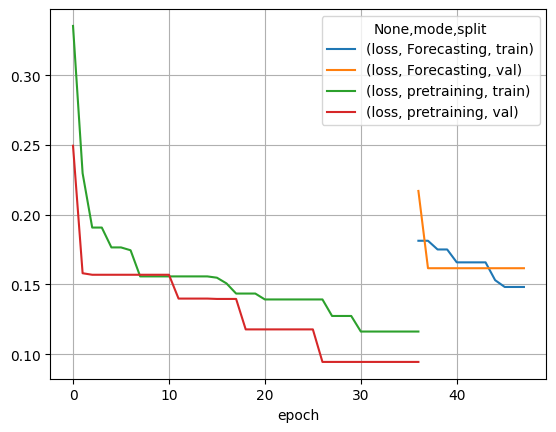

In [320]:
get_loss_df(59).plot(grid=True)

# new, good processing
- to do: pull in plotting functions from above

### 1. read in generated otputs from all model runs

In [344]:
def make_analytics_df(targets, preds, run_id, country, start_time, all_cols):
    my_cols = [col for col in all_cols if col in TARGET_COLS]
    preds = preds.median(0).values
    preds = pd.DataFrame(preds, columns=all_cols)
    preds.index = pd.date_range(start_time, periods=preds.shape[0], freq='MS')
    preds.index += pd.DateOffset(months=36) 

    targets = pd.DataFrame(targets, columns=all_cols)
    targets.index = pd.date_range(start_time, periods=targets.shape[0], freq='MS')

    df = pd.concat([targets[my_cols], preds[my_cols]], keys=['target','pred'], axis=1)
    # add contry and starttime levels to the df index with start time
    df.index = pd.MultiIndex.from_product([[run_id], [country], [start_time], df.index], names=['run_id', 'geo', 'start_time', 'time_period'])

    df['time_horizon'] = df['pred'].notna().any(axis=1).cumsum()

    return df

def prep_analytics_df(run_id, input_length, log_runs, is_pred=False):
    # Load saved results from pickle files
    path = f'../save/Forecasting/euro_all_countries/n_samples_100_run_{run_id}_linear_False_sample_feat_True'

    try:
        if os.path.exists(path):
            if is_pred:
                output_path = path + '/predictions'
            else:
                output_path = path

            #find file name, it's probably either generated_outputs_nsample100.pk or generated_outputs_nsample50.pk
            if os.path.exists(output_path):
                filename = [f for f in os.listdir(output_path) if f.startswith('generated_outputs_nsample')][0]
                with open(f'{output_path}/{filename}', 'rb') as f:
                    outputs = pickle.load(f)
                    (all_generated_samples, all_target, all_evalpoint, 
                    all_observed_point, all_observed_time, scaler, mean_scaler) = outputs

                # Validate the time horizon length
                time_horizon = all_generated_samples.shape[2] - input_length
                if time_horizon not in [3, 10, 18, 24]:
                    raise ValueError(f'Unexpected series length: {time_horizon}')
                
                # Scale the samples back to original values
                all_generated_samples = all_generated_samples * scaler + mean_scaler
                all_target = all_target * scaler + mean_scaler

                if run_id in log_runs:
                    all_generated_samples = np.exp(all_generated_samples)
                    all_target = np.exp(all_target)
                
                # Load the original dataframe and indices for alignment
                df = pd.read_pickle(f'{path}/raw_df.pkl')

                df_indices = pd.read_pickle(f'{output_path}/df_indices.pkl')
                if is_pred:
                    df_indices = df_indices[df_indices['split'] == 'predict']
                else:
                    df_indices = df_indices[df_indices['split'] == 'test']
                
                # return all_generated_samples, df_indices
                # slice all_generated_samples to get only the relevant  prediction steps
                my_samples = all_generated_samples[:, :, -time_horizon:, :]

                out_df = pd.concat(
                    [
                        make_analytics_df(target, sample, run_id, country, time_period, df.columns)
                        for (country, time_period), target, sample in zip(df_indices[['country', 'time_period']].values, all_target, my_samples)
                    ]
                )
                return out_df
    except Exception as e:
        print(run_id, e)
        return None

TARGET_COLS = ['ET-T_EU27_2020_EXP', 'ET-T_EXT_EU27_2020_EXP', 'ET-T_EXT_EU27_2020_IMP']
log_runs = [31,32,33,34,35,36,37,38,39,40,41,42,51,52,53,55,58,59, 60]
long_runs = [57, 58, 59, 60]



In [345]:

input_length = 36


big_df = pd.concat(prep_analytics_df(run_id, input_length if run_id not in long_runs else 48, log_runs) for run_id in tqdm(run_comments.keys()))
# big_df = pd.concat(prep_analytics_df(run_id, input_length if run_id not in long_runs else 48, log_runs) for run_id in tqdm(run_ids))

 71%|███████▏  | 30/42 [00:53<00:19,  1.66s/it]

48 Shape of passed values is (10, 16), indices imply (10, 19)


100%|██████████| 42/42 [01:13<00:00,  1.74s/it]


### 2. calculate raw metrics for all runs

In [346]:
def add_multi_to_df(old_df, new_df, level_name):
    # Add a new level to the index of the new DataFrame
    new_df.columns = pd.MultiIndex.from_product([[level_name], new_df.columns])
    
    # Concatenate the old and new DataFrames
    return pd.concat([old_df, new_df], axis=1)

In [347]:
diff = big_df['pred'] - big_df['target']
new_big_df = add_multi_to_df(big_df, diff, 'diff')

diff_pct =  new_big_df['diff'] / new_big_df['target']
new_big_df = add_multi_to_df(new_big_df, diff_pct, 'diff_pct')

rel_diff = new_big_df['pred'] / new_big_df['target']
new_big_df = add_multi_to_df(new_big_df, rel_diff, 'rel_diff')

msre_raw = new_big_df['diff_pct'] ** 2
new_big_df = add_multi_to_df(new_big_df, msre_raw, 'msre_raw')


th = 3
new_big_df = new_big_df[new_big_df['time_horizon'] == th]

all_time_periods = new_big_df.reset_index().groupby('run_id')['time_period'].apply(set).values
common_time_periods = set.intersection(*all_time_periods)
common_time_periods = set.union(*all_time_periods)
print(len(common_time_periods))
new_big_df = new_big_df[new_big_df.index.get_level_values(3).isin(common_time_periods)]
print(new_big_df.shape)
new_big_df[:10]

56
(33113, 19)


target                         \
                                  ET-T_EU27_2020_EXP ET-T_EXT_EU27_2020_EXP   
run_id geo start_time time_period                                             
18     AT  2018-10-01 2021-12-01         9779.900391            4539.500000   
           2018-11-01 2022-01-01        10516.099609            4408.700195   
           2018-12-01 2022-02-01        10981.799805            4615.900391   
           2019-01-01 2022-03-01        13046.500000            5298.500000   
           2019-02-01 2022-04-01        11355.000000            4698.100098   
           2019-03-01 2022-05-01        12234.699219            5346.700195   
           2019-04-01 2022-06-01        12009.799805            5317.200195   
           2019-05-01 2022-07-01        11164.199219            5083.100098   
           2019-06-01 2022-08-01        10523.799805            4831.300293   
           2019-07-01 2022-09-01        12822.199219            5472.300293   

                                                                       pred  \
                                  ET-T_EXT_EU27_2020_IMP ET-T_EU27_2020_EXP   
run_id geo start_time time_period                                             
18     AT  2018-10-01 2021-12-01             4264.500000        9810.297852   
           2018-11-01 2022-01-01             4801.100098        9594.941406   
           2018-12-01 2022-02-01             3984.399902       10084.046875   
           2019-01-01 2022-03-01             4912.600098       10181.691406   
           2019-02-01 2022-04-01             4766.600098       10555.921875   
           2019-03-01 2022-05-01             4737.399902       10114.654297   
           2019-04-01 2022-06-01             4044.899902       10130.480469   
           2019-05-01 2022-07-01             3937.100098       10400.130859   
           2019-06-01 2022-08-01             4473.100098       10702.664062   
           2019-07-01 2022-09-01             4789.200195       10836.207031   

                                                          \
                                  ET-T_EXT_EU27_2020_EXP   
run_id geo start_time time_period                          
18     AT  2018-10-01 2021-12-01             4789.520020   
           2018-11-01 2022-01-01             4858.805664   
           2018-12-01 2022-02-01             4629.070801   
           2019-01-01 2022-03-01             5184.318359   
           2019-02-01 2022-04-01             5142.566895   
           2019-03-01 2022-05-01             5015.866699   
           2019-04-01 2022-06-01             5098.642090   
           2019-05-01 2022-07-01             5173.425781   
           2019-06-01 2022-08-01             5275.039062   
           2019-07-01 2022-09-01             5364.413086   

                                                         time_horizon  \
                                  ET-T_EXT_EU27_2020_IMP                
run_id geo start_time time_period                                       
18     AT  2018-10-01 2021-12-01             3454.445312            3   
           2018-11-01 2022-01-01             3560.225342            3   
           2018-12-01 2022-02-01             3520.923096            3   
           2019-01-01 2022-03-01             3643.586670            3   
           2019-02-01 2022-04-01             3515.390869            3   
           2019-03-01 2022-05-01             3772.693359            3   
           2019-04-01 2022-06-01             3979.537842            3   
           2019-05-01 2022-07-01             4059.003418            3   
           2019-06-01 2022-08-01             4330.327637            3   
           2019-07-01 2022-09-01             4208.671387            3   

                                                diff                         \
                                  ET-T_EU27_2020_EXP ET-T_EXT_EU27_2020_EXP   
run_id geo start_time time_period                                             
18     AT  2018-10-01 

### 3. calculated ewm-corrected 
- script below does ewm correction grid search for each run/country and outputs the best params and results of the best run

In [348]:
def run_ewm_search(pred, target, rel_diff):
    ewm_params = {
        'com': [i / 25 for i in range(25, 500, 25)],
        'span': [i / 25 for i in range(25, 500, 25)],
        'halflife': range(1, 100),
        'alpha': [i / 100 for i in range(1, 100, 5)]  # alpha should be between 0 and 1
    }

    all_rmses = []
    all_preds = []
    all_params = []
    for param_name, param_values in ewm_params.items():
        for param_value in param_values:
            # Create the keyword argument dynamically
            kwargs = {param_name: param_value}
            all_params.append(kwargs)

            '''
                1) smooth the target and pred, 
                2) calculate the smooothed relative difference
                3) shift that into the future
                4) divide the pred by the shifted relative difference
            '''
            ewm_pred = pred.ewm(**kwargs).mean()
            ewm_target = target.ewm(**kwargs).mean()#.shift(3)
            ewm_rel_diff = (ewm_pred / ewm_target).shift(3)

            new_pred = ewm_pred.div(ewm_rel_diff)
            all_preds.append(new_pred)

            new_rmse = (((new_pred - target) / target) ** 2)
            all_rmses.append(new_rmse)

    all_rmses = np.stack(all_rmses)
    all_preds = np.stack(all_preds)
    all_params = np.stack(all_params)

    best_runs = all_rmses[:,-6:,:].mean(1).argmin(0)
    best_params = all_params[best_runs]
    best_preds = np.stack([all_preds[best_runs[i], :, i] for i in range(len(best_runs))]).T
    best_preds = pd.DataFrame(best_preds, columns=target.columns, index=target.index)
    return best_preds, best_params


adj_preds = []
adj_params = {}
for (run_id, geo), chunk in tqdm(new_big_df.groupby(['run_id','geo'])):
    # best_preds, best_params = run_ewm_search(chunk['target'], chunk['rel_diff'])
    best_preds, best_params = run_ewm_search(chunk['pred'], chunk['target'], chunk['rel_diff'])
    adj_preds.append(best_preds)
    adj_params[(run_id, geo)] = best_params

all_adj_preds = pd.concat(adj_preds)    

 17%|█▋        | 189/1107 [00:12<01:01, 14.97it/s]


KeyboardInterrupt: 

In [ ]:
new_big_df = add_multi_to_df(new_big_df, all_adj_preds, 'adj_pred')

diff = new_big_df['adj_pred'] - new_big_df['target']
new_big_df = add_multi_to_df(new_big_df, diff, 'adj_diff')

diff_pct =  new_big_df['adj_diff'] / new_big_df['target']
new_big_df = add_multi_to_df(new_big_df, diff_pct, 'adj_diff_pct')

msre_raw = new_big_df['adj_diff_pct'] ** 2
new_big_df = add_multi_to_df(new_big_df, msre_raw, 'msre_adj')

new_big_df[:10]

target                         \
                                  ET-T_EU27_2020_EXP ET-T_EXT_EU27_2020_EXP   
run_id geo start_time time_period                                             
18     AT  2018-10-01 2021-12-01         9779.900391            4539.500000   
           2018-11-01 2022-01-01        10516.099609            4408.700195   
           2018-12-01 2022-02-01        10981.799805            4615.900391   
           2019-01-01 2022-03-01        13046.500000            5298.500000   
           2019-02-01 2022-04-01        11355.000000            4698.100098   
           2019-03-01 2022-05-01        12234.699219            5346.700195   
           2019-04-01 2022-06-01        12009.799805            5317.200195   
           2019-05-01 2022-07-01        11164.199219            5083.100098   
           2019-06-01 2022-08-01        10523.799805            4831.300293   
           2019-07-01 2022-09-01        12822.199219            5472.300293   

                                                                       pred  \
                                  ET-T_EXT_EU27_2020_IMP ET-T_EU27_2020_EXP   
run_id geo start_time time_period                                             
18     AT  2018-10-01 2021-12-01             4264.500000        9810.297852   
           2018-11-01 2022-01-01             4801.100098        9594.941406   
           2018-12-01 2022-02-01             3984.399902       10084.046875   
           2019-01-01 2022-03-01             4912.600098       10181.691406   
           2019-02-01 2022-04-01             4766.600098       10555.921875   
           2019-03-01 2022-05-01             4737.399902       10114.654297   
           2019-04-01 2022-06-01             4044.899902       10130.480469   
           2019-05-01 2022-07-01             3937.100098       10400.130859   
           2019-06-01 2022-08-01             4473.100098       10702.664062   
           2019-07-01 2022-09-01             4789.200195       10836.207031   

                                                          \
                                  ET-T_EXT_EU27_2020_EXP   
run_id geo start_time time_period                          
18     AT  2018-10-01 2021-12-01             4789.520020   
           2018-11-01 2022-01-01             4858.805664   
           2018-12-01 2022-02-01             4629.070801   
           2019-01-01 2022-03-01             5184.318359   
           2019-02-01 2022-04-01             5142.566895   
           2019-03-01 2022-05-01             5015.866699   
           2019-04-01 2022-06-01             5098.642090   
           2019-05-01 2022-07-01             5173.425781   
           2019-06-01 2022-08-01             5275.039062   
           2019-07-01 2022-09-01             5364.413086   

                                                         time_horizon  \
                                  ET-T_EXT_EU27_2020_IMP                
run_id geo start_time time_period                                       
18     AT  2018-10-01 2021-12-01             3454.445312            3   
           2018-11-01 2022-01-01             3560.225342            3   
           2018-12-01 2022-02-01             3520.923096            3   
           2019-01-01 2022-03-01             3643.586670            3   
           2019-02-01 2022-04-01             3515.390869            3   
           2019-03-01 2022-05-01             3772.693359            3   
           2019-04-01 2022-06-01             3979.537842            3   
           2019-05-01 2022-07-01             4059.003418            3   
           2019-06-01 2022-08-01             4330.327637            3   
           2019-07-01 2022-09-01             4208.671387            3   

                                                diff                         \
                                  ET-T_EU27_2020_EXP ET-T_EXT_EU27_2020_EXP   
run_id geo start_time time_period                                             
18     AT  2018-10-01 

### 4. plot raw and adjusted average MSRE scores for each run
- we average, for each country/run combo, the final 6 months of MSRE scores, and take the sum of those averages

In [ ]:
def get_final_rmse(df, col):
    # calculate the run-level sum of the average for each counry's final 6 months of MSRE calcs
    return df[col].groupby(['run_id','geo']).tail(6).groupby(['run_id','geo']).mean().groupby('run_id').sum()

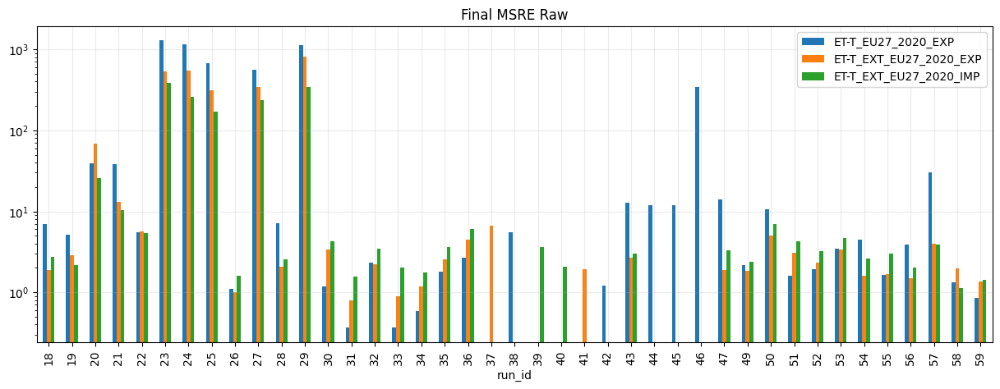

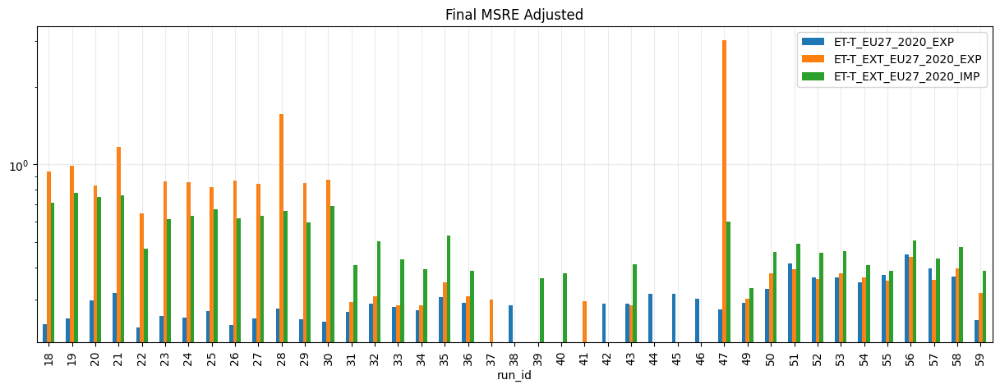

ET-T_EU27_2020_EXP        22
ET-T_EXT_EU27_2020_EXP    43
ET-T_EXT_EU27_2020_IMP    49
dtype: int64
ET-T_EU27_2020_EXP        0.008641
ET-T_EXT_EU27_2020_EXP    0.010517
ET-T_EXT_EU27_2020_IMP    0.012306
dtype: float64


In [ ]:
final_msre_raw = get_final_rmse(new_big_df, 'msre_raw')
# print(final_msre_raw.where(final_msre_raw > 0, np.nan).idxmin())
final_msre_raw.plot.bar(logy=True, figsize=(15,5), title='Final MSRE Raw')
plt.grid(alpha=.25)
plt.show()

final_msre_adj = get_final_rmse(new_big_df, 'msre_adj')
ax = final_msre_adj.plot.bar(logy=True, figsize=(15,5), title='Final MSRE Adjusted')
plt.grid(alpha=.25)

plt.show()

print(final_msre_adj.where(final_msre_adj > 0, np.nan).idxmin())
print(final_msre_adj.where(final_msre_adj > 0, np.nan).min() / 27)

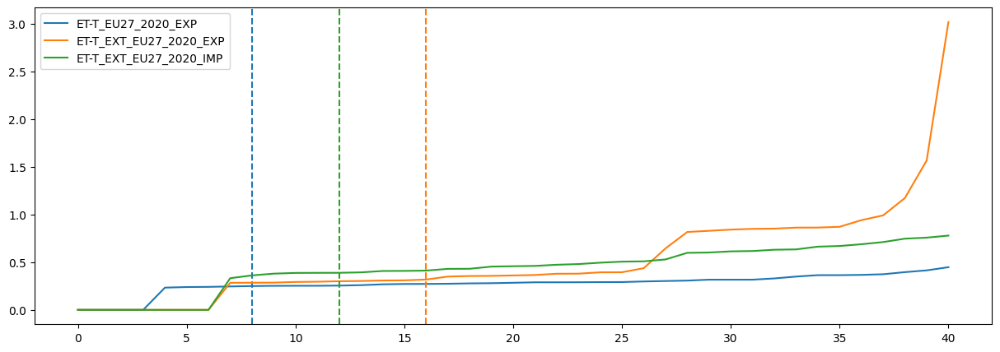

In [ ]:
# this plot shows the relative performance (in terms of adj msre) of a given run compared to all others
run_id = 59
fig, ax = plt.subplots(1, 1, figsize=(15, 5))
for col in final_msre_adj.columns:
    yo = final_msre_adj[col].sort_values()
    x = yo.index.get_loc(run_id)
    yo.reset_index(drop=True).plot(ax=ax, label=col)
    # find what the current color is and use it for the vertical line
    color = ax.get_lines()[-1].get_color()
    ax.axvline(x, color=color, linestyle='--')

ax.legend()    

In [ ]:
print_comment(run_ids)


34: base_data + "ET-CONXT" + new future, 36 mo, default params, LOG TRANSFORMS
58: base data + moy + bu/shorterm, 48 mo, default params, 18 pred steps, LOG TRANSFORMS


## plot preds targets and msres

AT


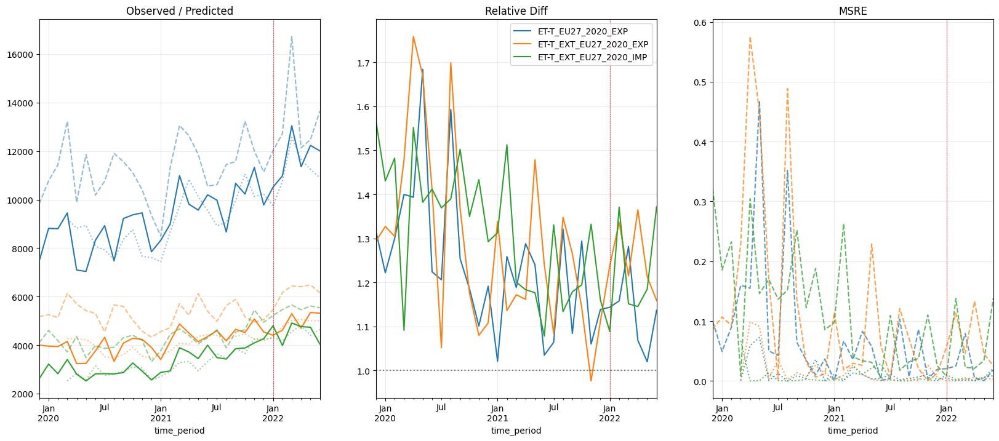

BE


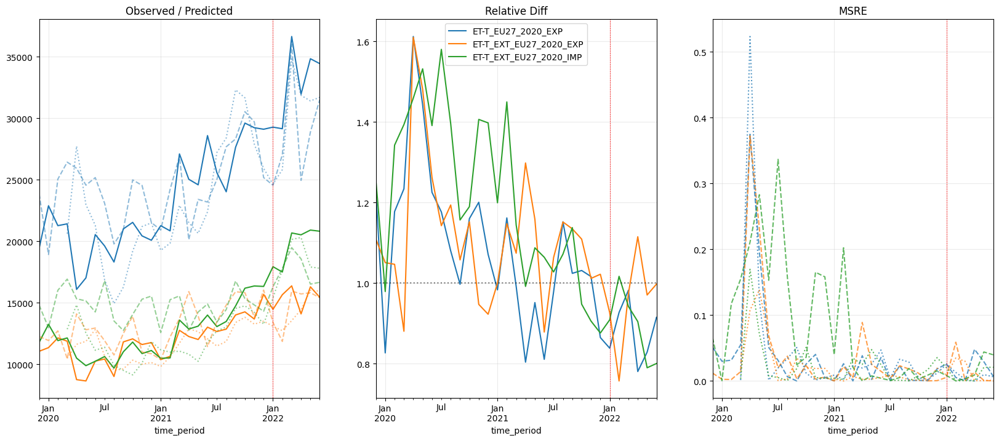

BG


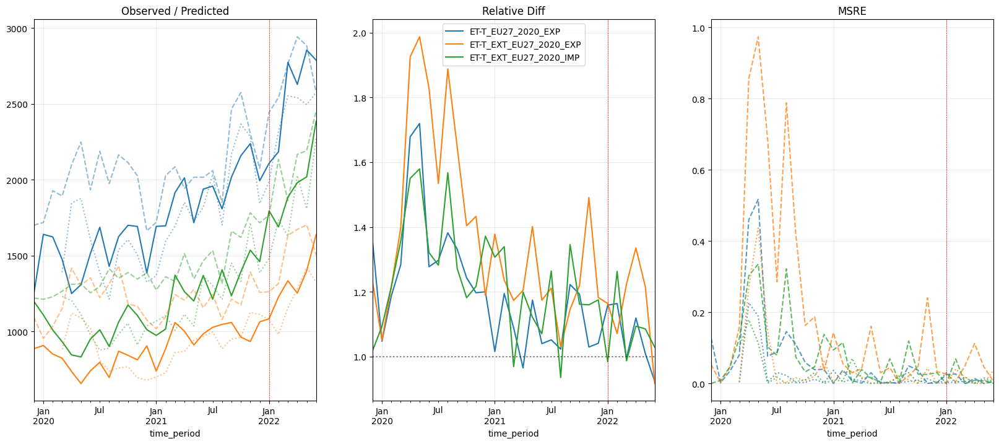

CY


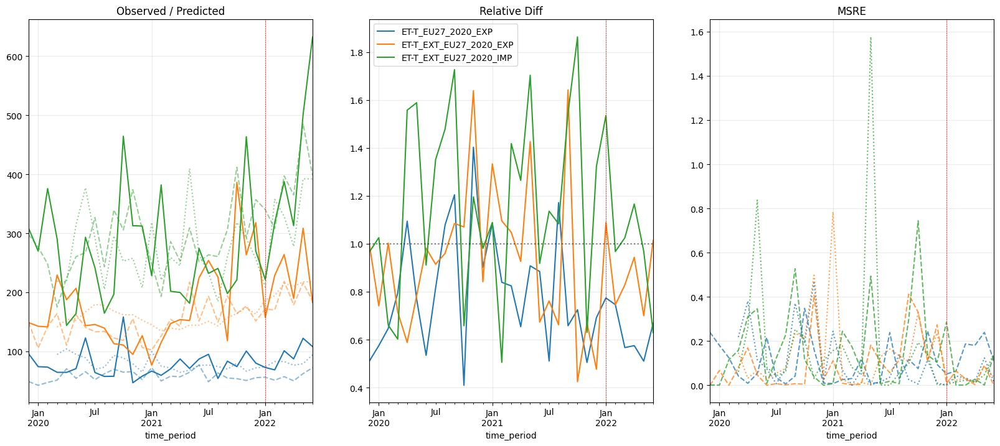

CZ


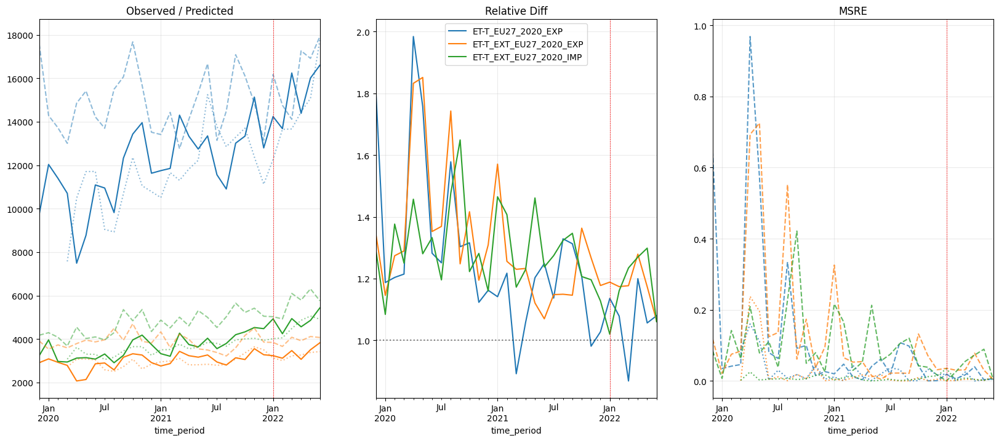

DE


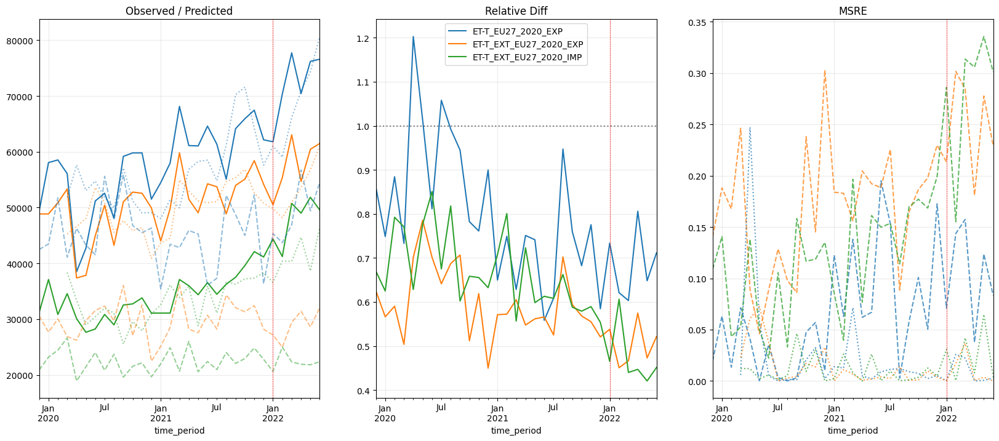

DK


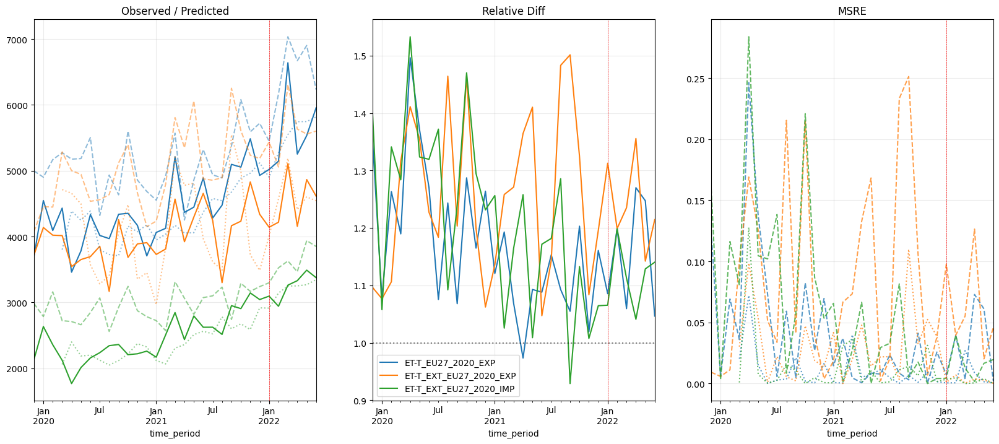

EE


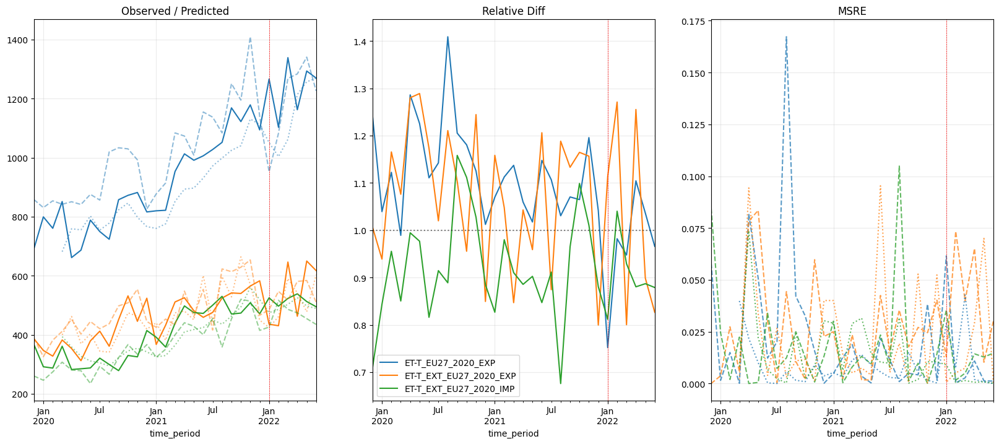

EL


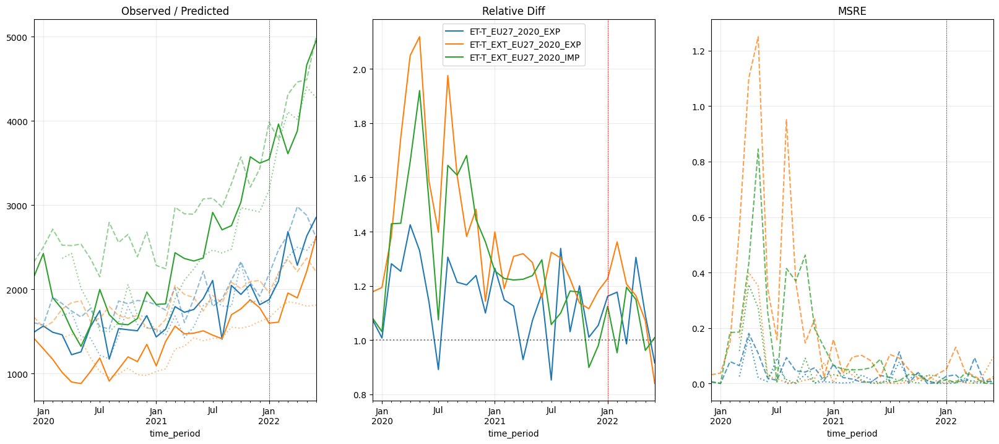

ES


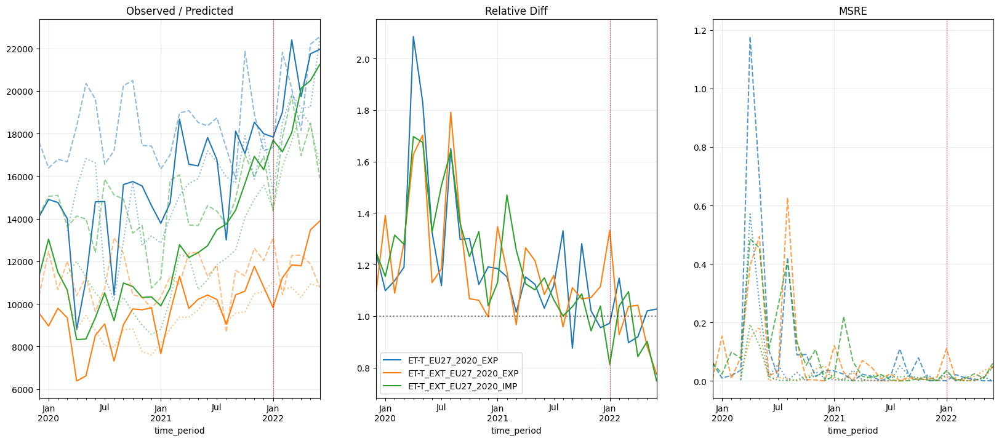

FI


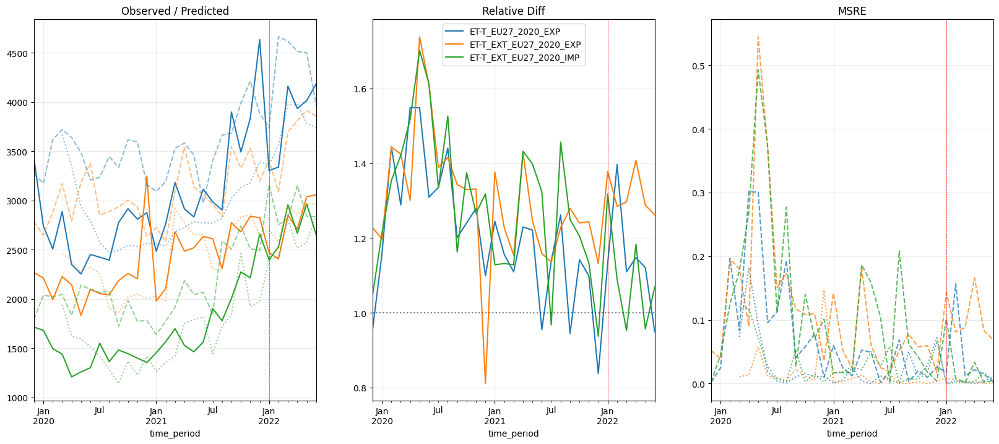

FR


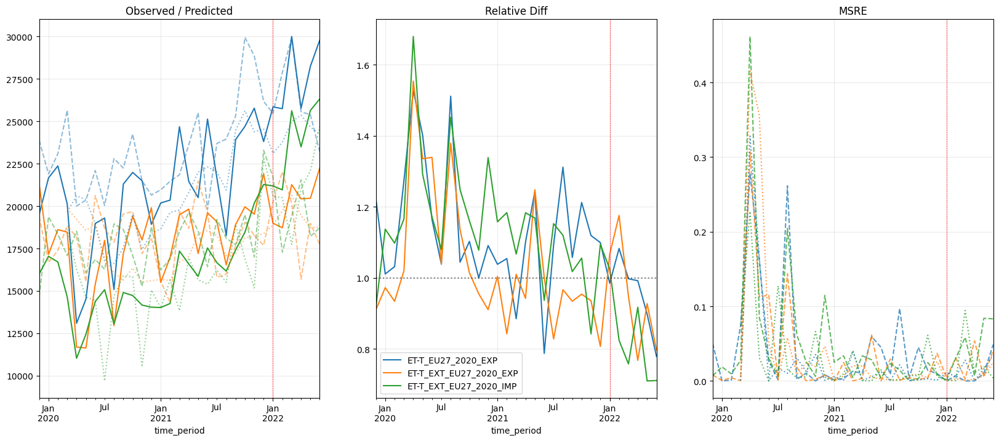

HR


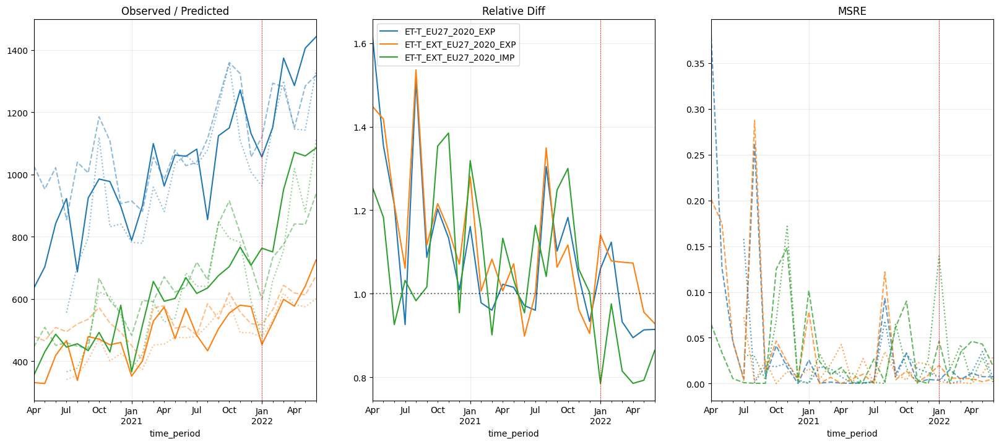

HU


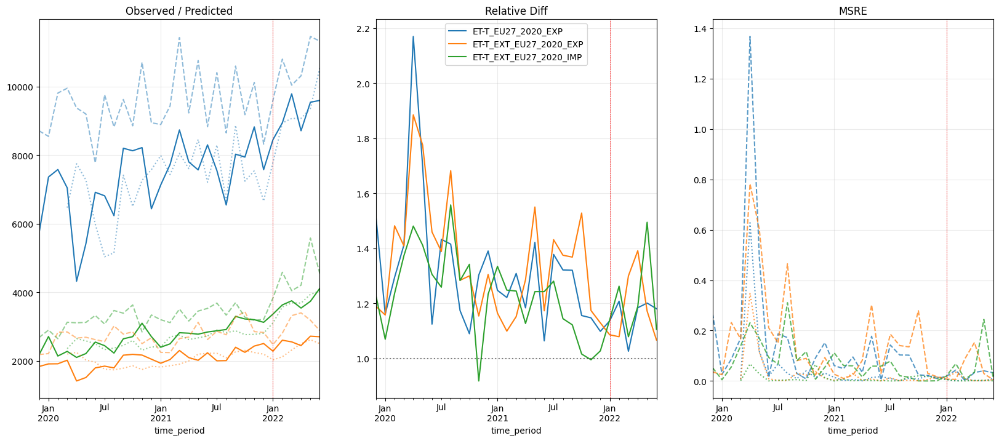

IE


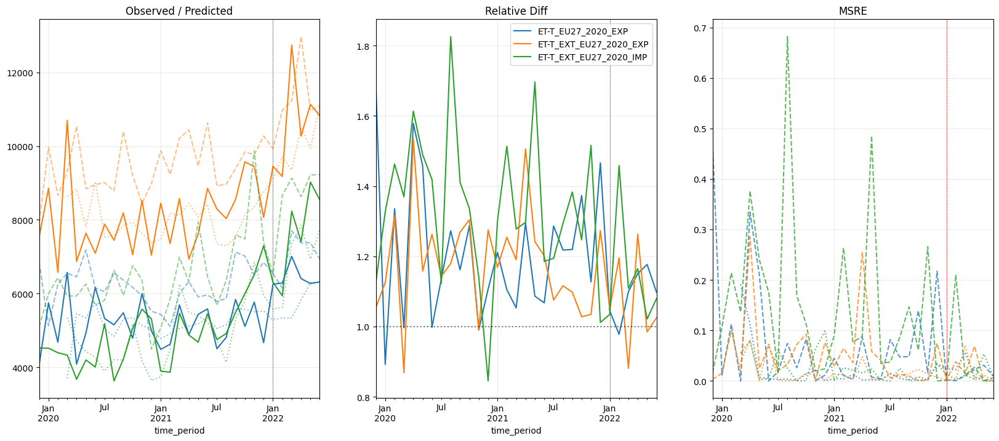

IT


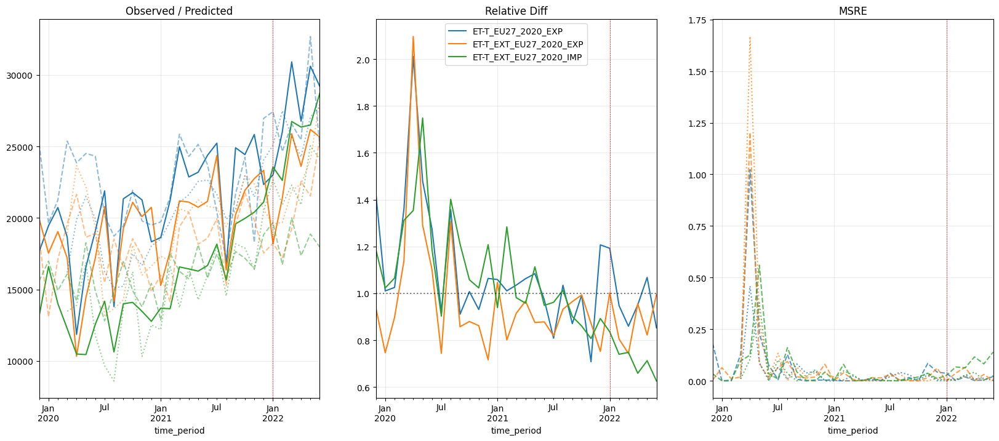

LT


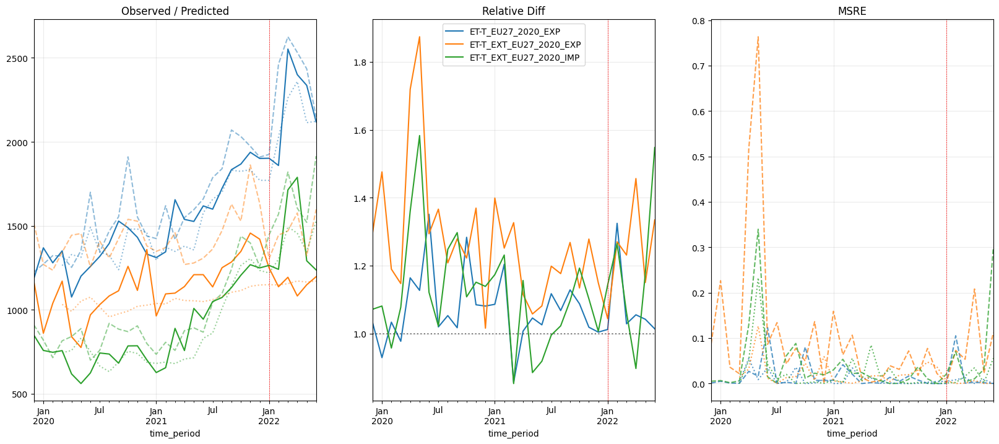

LU


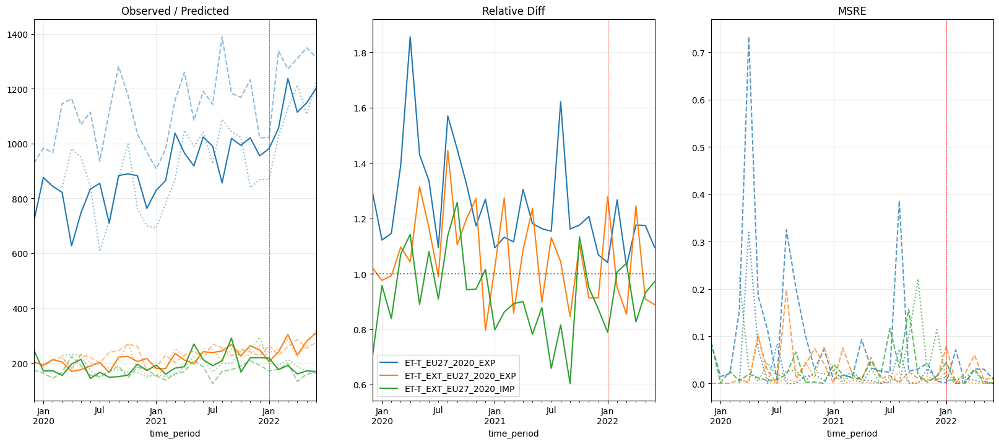

LV


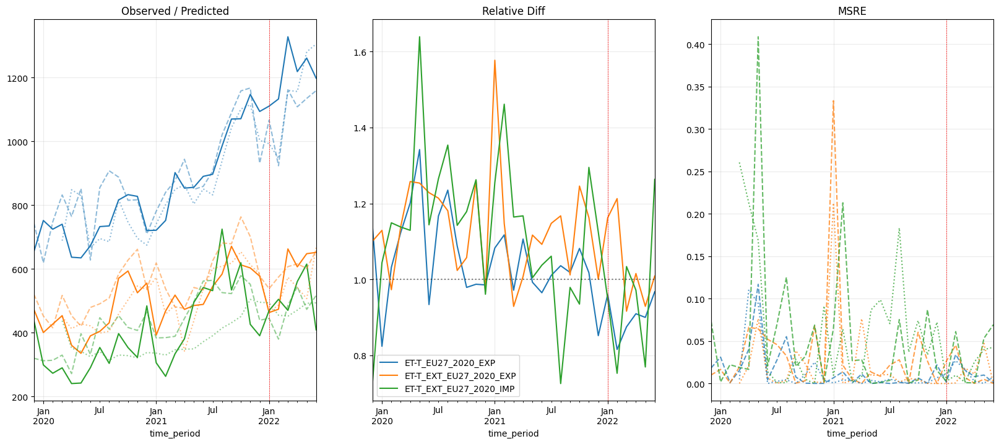

MT


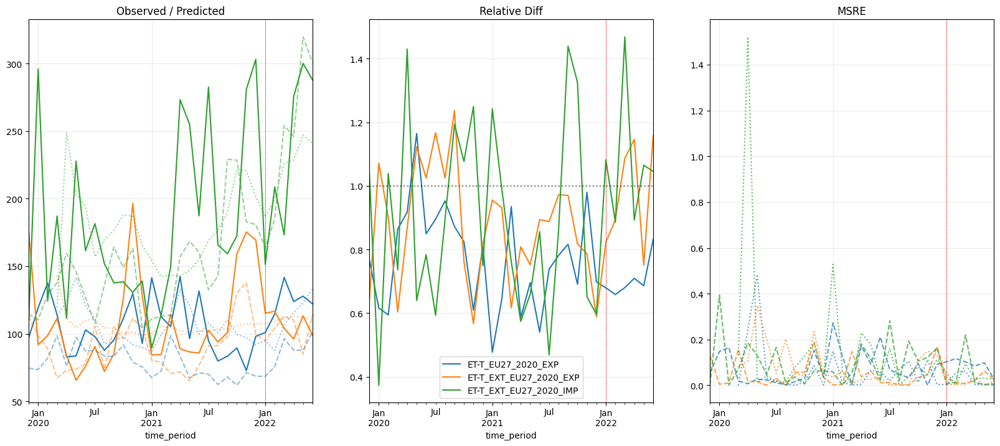

NL


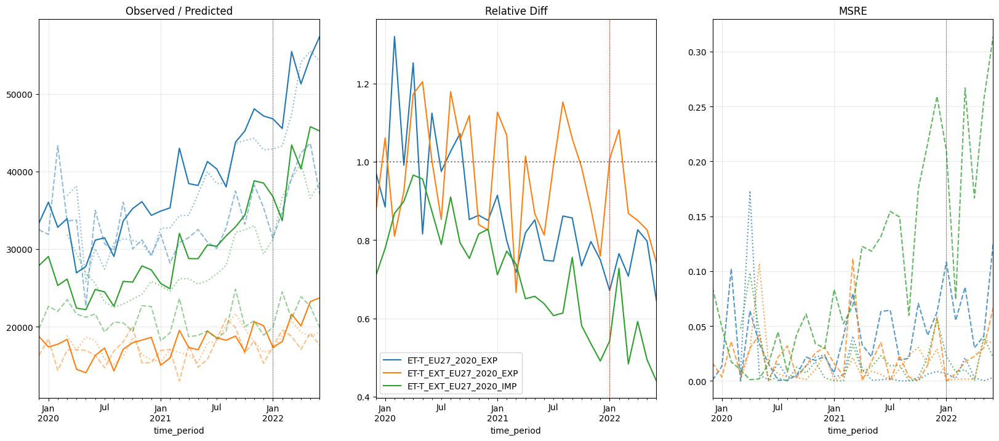

PL


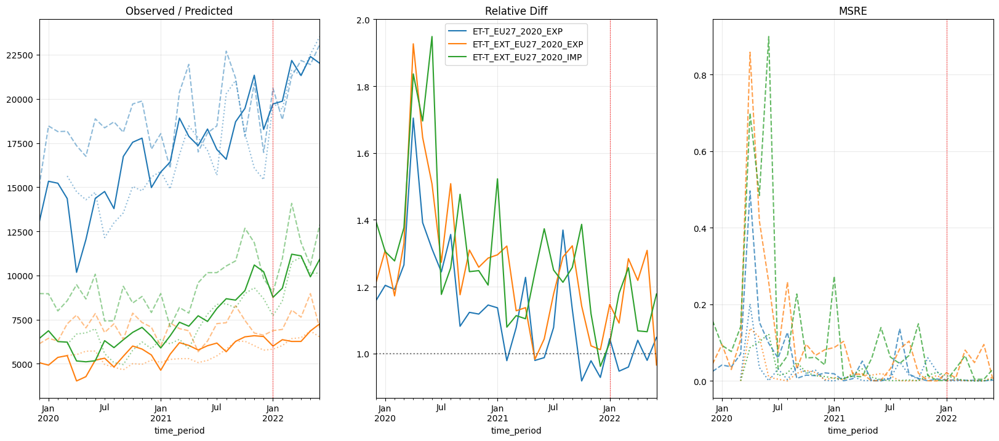

PT


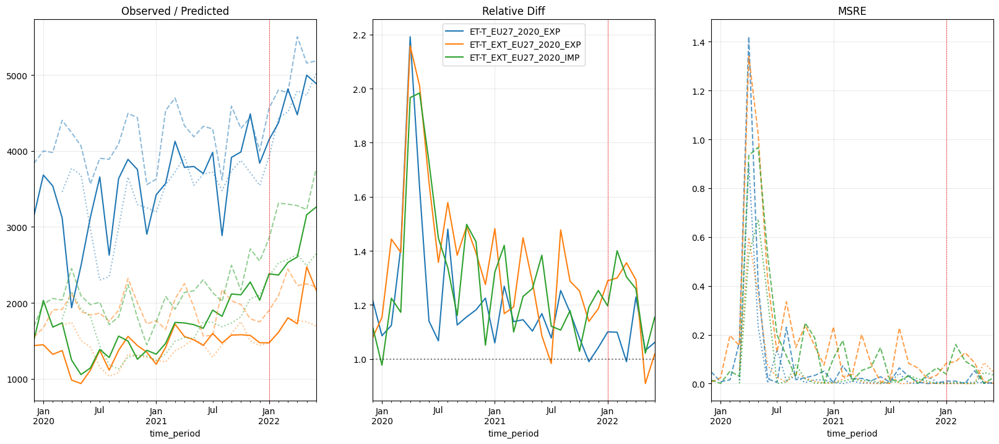

RO


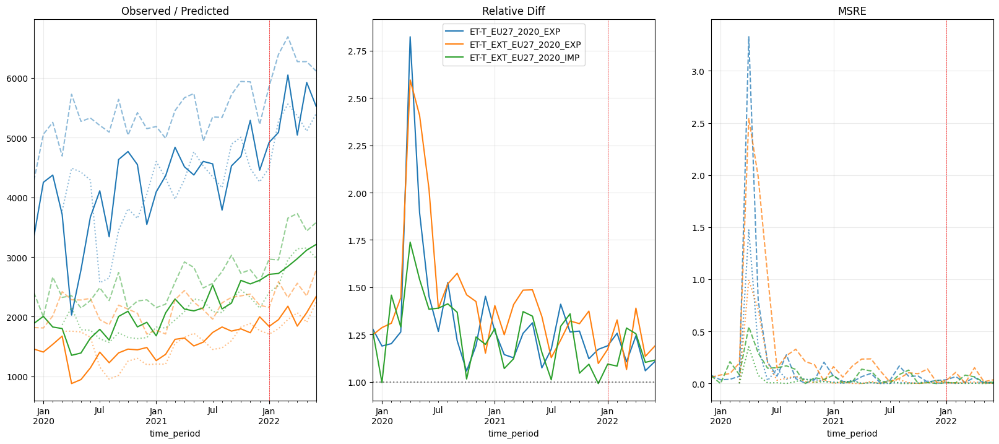

SE


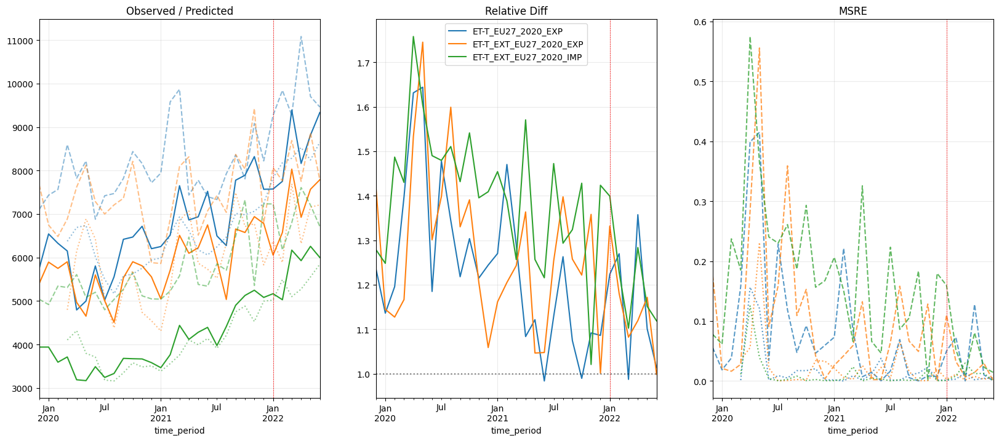

SI


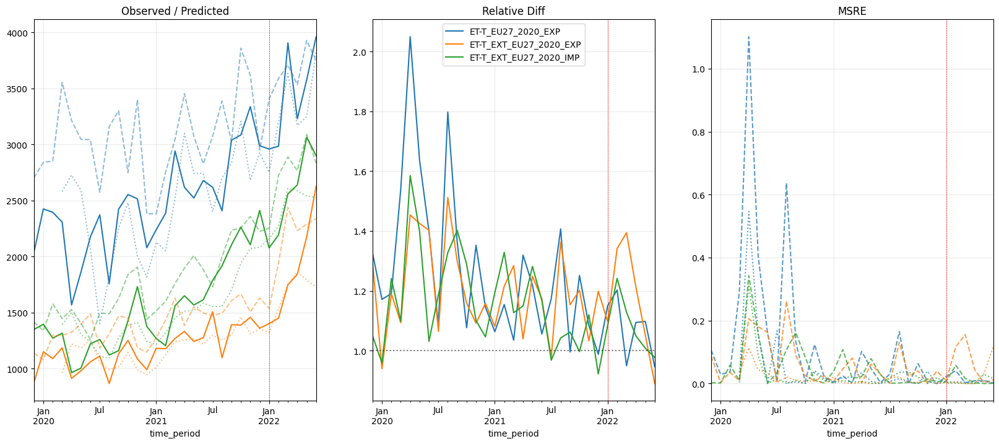

SK


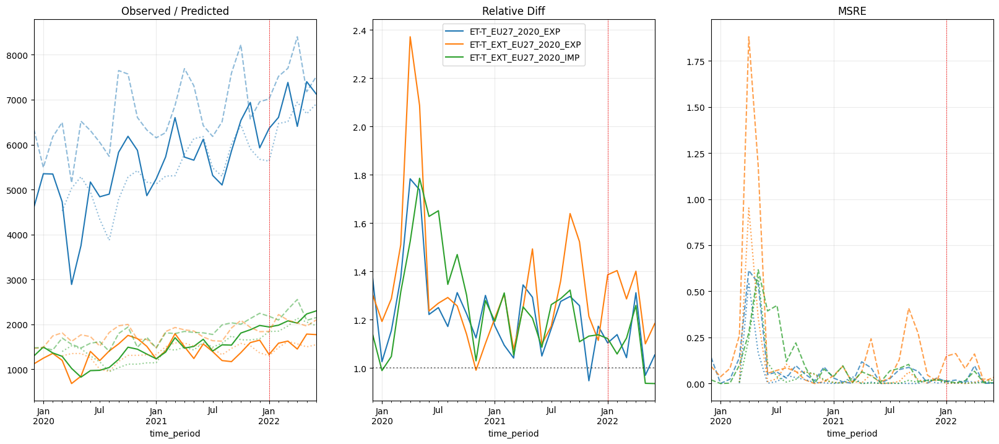

In [ ]:
run_id = 60
time_horizon = 6
n_months = 6

df_temp = new_big_df.loc[run_id]
df_temp = df_temp[df_temp['time_horizon'] == th].droplevel(1)

for country in df_temp.index.get_level_values(0).unique():
    print(country)
    figg, (ax0, ax1, ax2,) = plt.subplots(1, 3, figsize=(20, 8))

    # plot targets and raw preds
    df_temp.loc[country]['target'].plot(ax=ax0, legend=False, title='Observed / Predicted')
    ax0.set_prop_cycle(None)    
    df_temp.loc[country]['pred'].plot(ax=ax0, linestyle='--', alpha=.5, legend=False)
    ax0.set_prop_cycle(None)    
    df_temp.loc[country]['adj_pred'].plot(ax=ax0, linestyle=':', alpha=.5, legend=False)
    
    # plot relative diff
    df_temp.loc[country]['rel_diff'].plot(ax=ax1, title='Relative Diff')
    ax1.axhline(1, color='black', linestyle=':', alpha=.5)

    # plot msre
    df_temp.loc[country]['msre_raw'].plot(ax=ax2, linestyle='--', alpha=.75, title='MSRE', legend=False)
    ax2.set_prop_cycle(None) 
    df_temp.loc[country]['msre_adj'].plot(ax=ax2, linestyle=':', alpha=.75, legend=False)

    for ax in [ax0, ax1, ax2]:
        ax.axvline(df_temp.loc[country].index[-n_months], color='r', linestyle='--', linewidth=.5)
        ax.grid(alpha=.25)

    # # plot mean raw and adjusted msre for the last 6 months in a bar
    # df_bars = pd.DataFrame([
    #     df_temp.loc[country]['msre_raw'].tail(n_months).mean(),
    #     df_temp.loc[country]['msre_adj'].tail(n_months).mean(),
    #     ],
    #     index=['raw', 'adj']
    #     ).T
    # df_bars['diff'] = df_bars['raw'] - df_bars['adj']
    # df_bars.T.plot.bar(ax=ax3, legend=False, title='Mean MSREs')   

    plt.show()
    # break

### chart for illustrating the prediction adjustment

In [ ]:
run_id

59

In [368]:
from matplotlib.lines import Line2D


df_temp = new_big_df.loc[run_id]
df_temp = df_temp[df_temp['time_horizon'] == th].droplevel(1)
country = 'DE'

print(country)
figg, (ax0, ax1, ) = plt.subplots(1, 2, figsize=(20, 8))

# plot targets and raw preds
df_temp.loc[country]['target'].plot(ax=ax0, legend=True, title='Observed / Predicted / Adjusted')
ax0.set_prop_cycle(None)    
df_temp.loc[country]['pred'].plot(ax=ax0, linestyle='--', alpha=.65, legend=False)
ax0.set_prop_cycle(None)    
df_temp.loc[country]['adj_pred'].plot(ax=ax0, linestyle=':', alpha=.65, legend=False)

# plot relative diff

ewm_target = df_temp.loc[country]['target'].ewm(span=10).mean()
ewm_target.plot(ax=ax1, legend=False, title='Smoothed Obs/Pred Ratio Calc')

ax1.set_prop_cycle(None)    
ewm_pred = df_temp.loc[country]['pred'].ewm(span=10).mean()
ewm_pred.plot(ax=ax1, linestyle='--', alpha=.65, legend=False)

ax1.set_prop_cycle(None)    
ewm_rel_diff = (ewm_pred / ewm_target).shift(3)
secondary_ax = ewm_rel_diff.plot(ax=ax1, linestyle='-.', alpha=.65, legend=False, secondary_y=True)

# Set the label for the secondary y-axis
secondary_ax.set_ylabel("Obs/Pred Ratio")

# ax1.secondary_yaxis(ylabel ='Smoothed Obs/Pred Ratio')
# add entries to the legend to indicate what the linestyles represent, don't overwrite the existing legend
style_dict = {
    'Observed': '-',
    'Predicted': '--',
    'Adjusted': ':',
    'Obs/Pred Ratio': '-.'
}

# create custom legend entries
custom_lines = [
    Line2D([0], [0], color='tab:blue', linestyle=style_dict['Observed'], label='Observed'),
    Line2D([0], [0], color='tab:orange', linestyle=style_dict['Predicted'], label='Predicted'),
    Line2D([0], [0], color='tab:green', linestyle=style_dict['Adjusted'], label='Adjusted'),
    Line2D([0], [0], color='tab:purple', linestyle=style_dict['Obs/Pred Ratio'], label='Obs/Pred Ratio')
]

# Create custom legend handles
legend_handles = [Line2D([0], [0], color='black', linestyle=style_dict[label], label=label) for label in style_dict]

# Add these handles to the existing legend on ax0
current_handles, current_labels = ax0.get_legend_handles_labels()
ax0.legend(current_handles[:3] + legend_handles, current_labels[:3] + list(style_dict.keys()), loc='upper left')

plt.show()

KeyError: 60

In [ ]:
print_comment(58)

58: base data + moy + bu/shorterm, 48 mo, default params, 18 pred steps, LOG TRANSFORMS


# generate model predictions

In [358]:
run_ids = [34, 35, 45, 49, 58]
run_ids = [34, 35, 49, 57, 58]
run_ids = [34, 58, 59, 60]

big_pred_df = pd.concat(prep_analytics_df(run_id, input_length, log_runs, is_pred=True) for run_id in tqdm(run_ids))

big_pred_df

100%|██████████| 4/4 [00:10<00:00,  2.72s/it]


target  \
                                  ET-T_EXT_EU27_2020_IMP   
run_id geo start_time time_period                          
34     AT  2018-05-01 2018-05-01             3515.999512   
                      2018-06-01             3273.298828   
                      2018-07-01             3342.299072   
                      2018-08-01             3010.900635   
                      2018-09-01             3192.000977   
...                                                  ...   
60     SK  2021-10-01 2025-11-01             1150.760864   
                      2025-12-01             1150.760864   
                      2026-01-01             1150.760864   
                      2026-02-01             1150.760864   
                      2026-03-01             1150.760864   

                                                                             \
                                  ET-T_EXT_EU27_2020_EXP ET-T_EU27_2020_EXP   
run_id geo start_time time_period                                             
34     AT  2018-05-01 2018-05-01             3793.600098        8895.704102   
                      2018-06-01             4204.698730        9420.202148   
                      2018-07-01             4235.898438        9006.402344   
                      2018-08-01             3798.998291        7987.201172   
                      2018-09-01             4204.798828        8812.001953   
...                                                  ...                ...   
60     SK  2021-10-01 2025-11-01              870.557678        1639.147095   
                      2025-12-01              870.557678        1639.147095   
                      2026-01-01              870.557678        1639.147095   
                      2026-02-01              870.557678        1639.147095   
                      2026-03-01              870.557678        1639.147095   

                                                    pred  \
                                  ET-T_EXT_EU27_2020_IMP   
run_id geo start_time time_period                          
34     AT  2018-05-01 2018-05-01                     NaN   
                      2018-06-01                     NaN   
                      2018-07-01                     NaN   
                      2018-08-01                     NaN   
                      2018-09-01                     NaN   
...                                                  ...   
60     SK  2021-10-01 2025-11-01             2789.740723   
                      2025-12-01             2644.082031   
                      2026-01-01             2473.423096   
                      2026-02-01             2688.608643   
                      2026-03-01             2450.481934   

                                                                             \
                                  ET-T_EXT_EU27_2020_EXP ET-T_EU27_2020_EXP   
run_id geo start_time time_period                                             
34     AT  2018-05-01 2018-05-01                     NaN                NaN   
                      2018-06-01                     NaN                NaN   
                      2018-07-01                     NaN                NaN   
                      2018-08-01                     NaN                NaN   
                      2018-09-01                     NaN                NaN   
...                                                  ...                ...   
60     SK  2021-10-01 2025-11-01             2715.477295        9307.693359   
                      2025-12-01             2698.128906        9099.210938   
                      2026-01-01             2658.973633        8510.589844   
                      2026-02-01             2619.521973        8472.269531   
                      2026-03-01             2753.771729        8858.581055   

                                  time_horizon  
                                                
run_id geo start_time time_period               
34     

In [360]:
# SOMETHING is going on here, you need to carefully repeat this operation if you load multiple runs
funky_vals = np.array([x for x in pd.DataFrame(big_pred_df['target'].value_counts()).iloc[0].name])
big_pred_df['target'] = big_pred_df['target'].where(big_pred_df['target'] != funky_vals, np.nan)
print(pd.DataFrame(big_pred_df['target'].value_counts()))


                                                                  count
ET-T_EXT_EU27_2020_IMP ET-T_EXT_EU27_2020_EXP ET-T_EU27_2020_EXP       
2526.800537            2404.999512            3339.801025           187
2382.899902            1474.699951            4150.100586           187
2411.100342            1360.500122            2988.600830           187
6515.098145            9439.501953            5771.198242           187
2273.299805            2681.099854            3491.600098           187
...                                                                 ...
2034.799561            1594.400024            1361.400269             1
16296.702148           19553.804688           21228.207031            1
355.000061             450.900024             719.100098              1
4332.902344            5464.998535            6564.700195             1
1064.800171            807.300171             2415.499512             1

[3606 rows x 1 columns]


In [361]:
diff = big_pred_df['pred'] - big_pred_df['target']
new_big_pred_df = add_multi_to_df(big_pred_df, diff, 'diff')

diff_pct =  new_big_pred_df['diff'] / new_big_pred_df['target']
new_big_pred_df = add_multi_to_df(new_big_pred_df, diff_pct, 'diff_pct')

rel_diff = new_big_pred_df['pred'] / new_big_pred_df['target']
new_big_pred_df = add_multi_to_df(new_big_pred_df, rel_diff, 'rel_diff')

msre_raw = new_big_pred_df['diff_pct'] ** 2
new_big_pred_df = add_multi_to_df(new_big_pred_df, msre_raw, 'msre_raw')


th = 3
new_big_pred_df = new_big_pred_df[new_big_pred_df['time_horizon'] == th]

all_time_periods = new_big_pred_df.reset_index().groupby('run_id')['time_period'].apply(set).values
common_time_periods = set.intersection(*all_time_periods)
common_time_periods = set.union(*all_time_periods)

new_big_pred_df = new_big_pred_df[new_big_pred_df.index.get_level_values(3).isin(common_time_periods)]
new_big_pred_df.shape
# new_big_pred_df.loc[(run_id,'AT')].ewm(com=25).mean()

(5034, 19)

In [362]:
# def apply_ewm_adjustment(pred, target, params):
#     new_pred = deepcopy(pred)
#     for i, col in enumerate(pred.columns):
#         kwargs = params[i]
#         ewm_pred = pred[col].ewm(**kwargs).mean()
#         ewm_target = target[col].ewm(**kwargs).mean()#.shift(3)
#         ewm_rel_diff = (ewm_pred / ewm_target).shift(3)
#         new_pred[col] = ewm_pred.div(ewm_rel_diff)

#     return new_pred

# adj_preds = []
# for (run_id, geo), chunk in new_big_pred_df.groupby(['run_id','geo']):
#     new_pred = apply_ewm_adjustment(chunk['pred'], chunk['target'], adj_params[(run_id, geo)])
#     adj_preds.append(new_pred)

# all_adj_preds = pd.concat(adj_preds)

def run_ewm_search(pred, target, rel_diff):
    ewm_params = {
        'com': [i / 25 for i in range(25, 500, 25)],
        'span': [i / 25 for i in range(25, 500, 25)],
        'halflife': range(1, 100),
        'alpha': [i / 100 for i in range(1, 100, 5)]  # alpha should be between 0 and 1
    }

    all_rmses = []
    all_preds = []
    all_params = []
    for param_name, param_values in ewm_params.items():
        for param_value in param_values:
            # Create the keyword argument dynamically
            kwargs = {param_name: param_value}
            all_params.append(kwargs)

            '''
                1) smooth the target and pred, 
                2) calculate the smooothed relative difference
                3) shift that into the future
                4) divide the pred by the shifted relative difference
            '''
            ewm_pred = pred.ewm(**kwargs).mean()
            ewm_target = target.ewm(**kwargs).mean()#.shift(3)
            ewm_rel_diff = (ewm_pred / ewm_target).shift(3)
            new_pred = ewm_pred.div(ewm_rel_diff)
            all_preds.append(new_pred)

            new_rmse = (((new_pred - target) / target) ** 2).dropna()
            all_rmses.append(new_rmse)

    all_rmses = np.stack(all_rmses)
    all_preds = np.stack(all_preds)
    all_params = np.stack(all_params)

    best_run_idxs = all_rmses[:,-6:,:].mean(1).argmin(0)

    best_params = all_params[best_run_idxs]
    best_preds = np.stack([all_preds[best_run_idxs[i], :, i] for i in range(len(best_run_idxs))]).T
    best_preds = pd.DataFrame(best_preds, columns=target.columns, index=target.index)
    return best_preds, best_params

adj_preds = []
adj_params = {}
for (run_id, geo), chunk in tqdm(new_big_pred_df.groupby(['run_id','geo'])):
    # print(run_id, geo, chunk.shape)
    # best_preds, best_params = run_ewm_search(chunk['target'], chunk['rel_diff'])
    best_preds, best_params = run_ewm_search(chunk['pred'], chunk['target'], chunk['rel_diff'])
    adj_preds.append(best_preds)
    adj_params[(run_id, geo)] = best_params

all_adj_preds = pd.concat(adj_preds)   
all_adj_preds.shape

100%|██████████| 108/108 [00:11<00:00,  9.69it/s]


(5034, 3)

In [363]:
new_big_pred_df = add_multi_to_df(new_big_pred_df, all_adj_preds, 'adj_pred')

diff = new_big_pred_df['adj_pred'] - new_big_pred_df['target']
new_big_pred_df = add_multi_to_df(new_big_pred_df, diff, 'adj_diff')

diff_pct =  new_big_pred_df['adj_diff'] / new_big_pred_df['target']
new_big_pred_df = add_multi_to_df(new_big_pred_df, diff_pct, 'adj_diff_pct')

msre_raw = new_big_pred_df['adj_diff_pct'] ** 2
new_big_pred_df = add_multi_to_df(new_big_pred_df, msre_raw, 'msre_adj')

new_big_pred_df

target  \
                                  ET-T_EXT_EU27_2020_IMP   
run_id geo start_time time_period                          
34     AT  2018-05-01 2021-07-01             3486.199951   
           2018-06-01 2021-08-01             3426.199463   
           2018-07-01 2021-09-01             3852.499268   
           2018-08-01 2021-10-01             3883.199707   
           2018-09-01 2021-11-01             4094.102051   
...                                                  ...   
60     SK  2021-06-01 2024-08-01             1639.000122   
           2021-07-01 2024-09-01             1863.900269   
           2021-08-01 2024-10-01             2189.599609   
           2021-09-01 2024-11-01                     NaN   
           2021-10-01 2024-12-01                     NaN   

                                                                             \
                                  ET-T_EXT_EU27_2020_EXP ET-T_EU27_2020_EXP   
run_id geo start_time time_period                                             
34     AT  2018-05-01 2021-07-01             4597.401855        9977.996094   
           2018-06-01 2021-08-01             4179.101562        8665.602539   
           2018-07-01 2021-09-01             4653.702148       10671.098633   
           2018-08-01 2021-10-01             4520.599609       10229.698242   
           2018-09-01 2021-11-01             5077.598633       11327.898438   
...                                                  ...                ...   
60     SK  2021-06-01 2024-08-01             1834.599854        6231.797363   
           2021-07-01 2024-09-01             2052.999268        7148.798828   
           2021-08-01 2024-10-01             2390.299316        8047.895996   
           2021-09-01 2024-11-01                     NaN                NaN   
           2021-10-01 2024-12-01                     NaN                NaN   

                                                    pred  \
                                  ET-T_EXT_EU27_2020_IMP   
run_id geo start_time time_period                          
34     AT  2018-05-01 2021-07-01             3420.437256   
           2018-06-01 2021-08-01             3181.773926   
           2018-07-01 2021-09-01             3232.838135   
           2018-08-01 2021-10-01             3471.366943   
           2018-09-01 2021-11-01             3152.906006   
...                                                  ...   
60     SK  2021-06-01 2024-08-01             2411.686768   
           2021-07-01 2024-09-01             2591.901367   
           2021-08-01 2024-10-01             2659.668457   
           2021-09-01 2024-11-01             2526.054932   
           2021-10-01 2024-12-01             2692.615234   

                                                                             \
                                  ET-T_EXT_EU27_2020_EXP ET-T_EU27_2020_EXP   
run_id geo start_time time_period                                             
34     AT  2018-05-01 2021-07-01             4544.191406        9411.914062   
           2018-06-01 2021-08-01             4037.288330        7999.481934   
           2018-07-01 2021-09-01             3971.997803        9516.113281   
           2018-08-01 2021-10-01             4693.839355        9856.699219   
           2018-09-01 2021-11-01             4738.672852       11734.952148   
...                                                  ...                ...   
60     SK  2021-06-01 2024-08-01             2683.210205        8467.359375   
           2021-07-01 2024-09-01             2714.879150        8459.174805   
           2021-08-01 2024-10-01             2670.617920        8510.062500   
           2021-09-01 2024-11-01             2641.133545        8755.701172   
           2021-10-01 2024-12-01             2568.278809        8449.870117   

                                  time_horizon                   diff  \
                                               ET-T_EXT_EU27_2020_IMP   
run_id g

AT


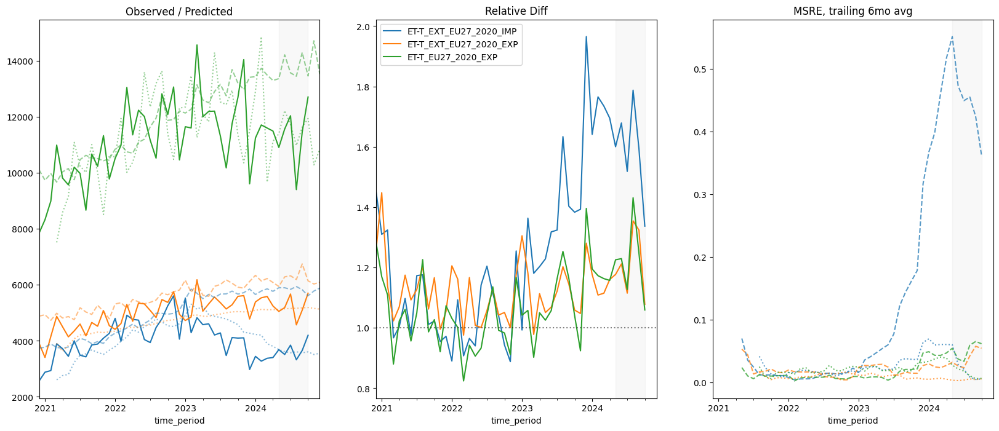

BE


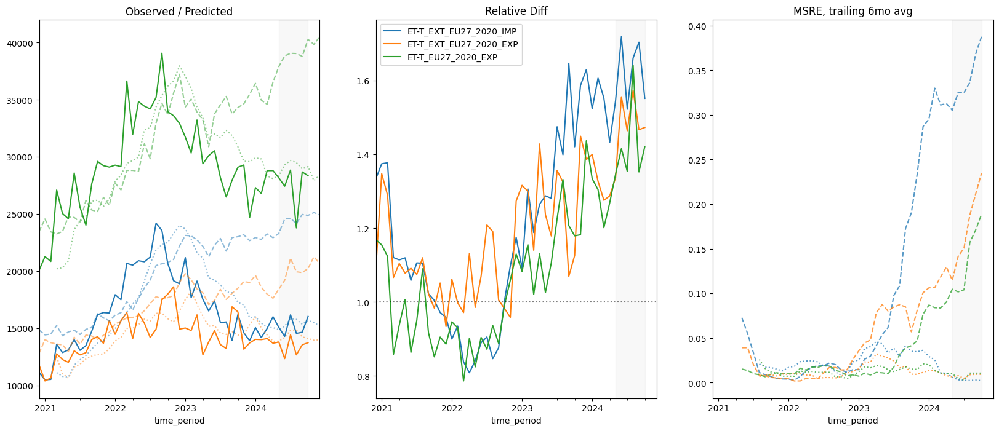

BG


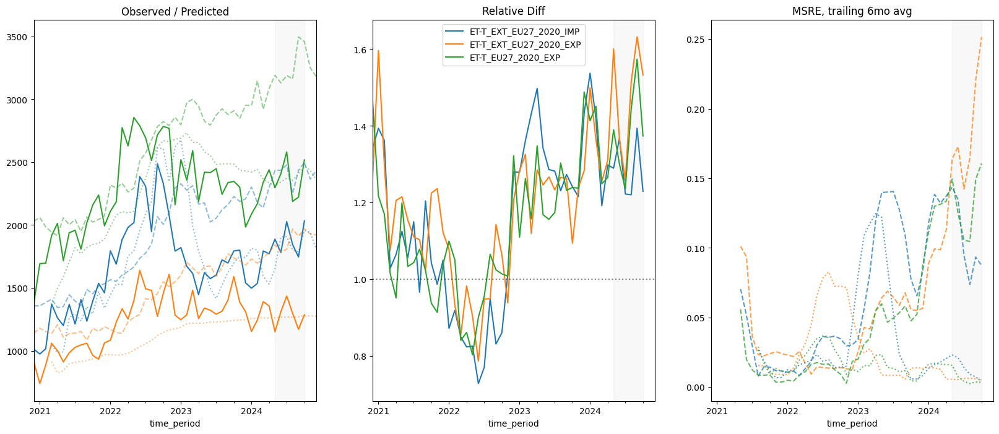

CY


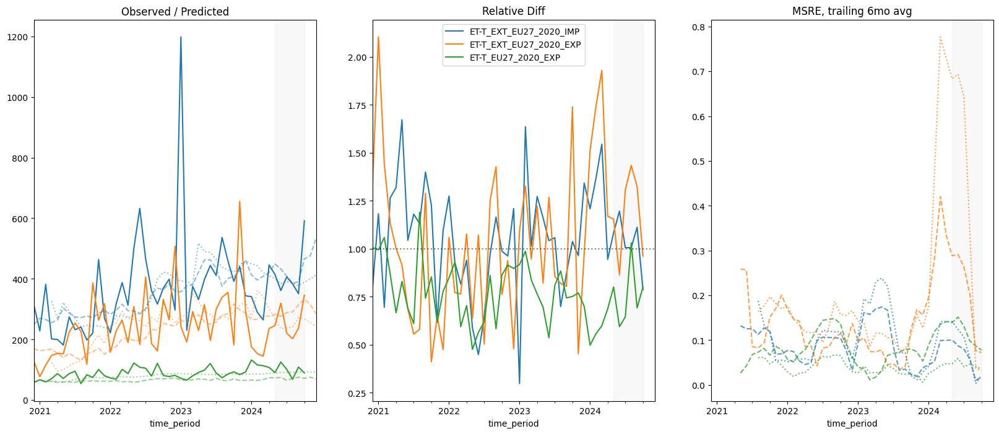

CZ


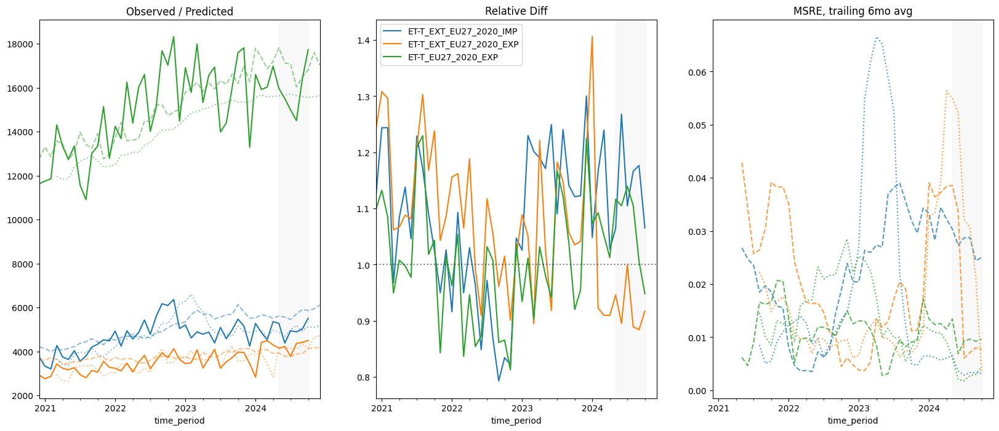

DE


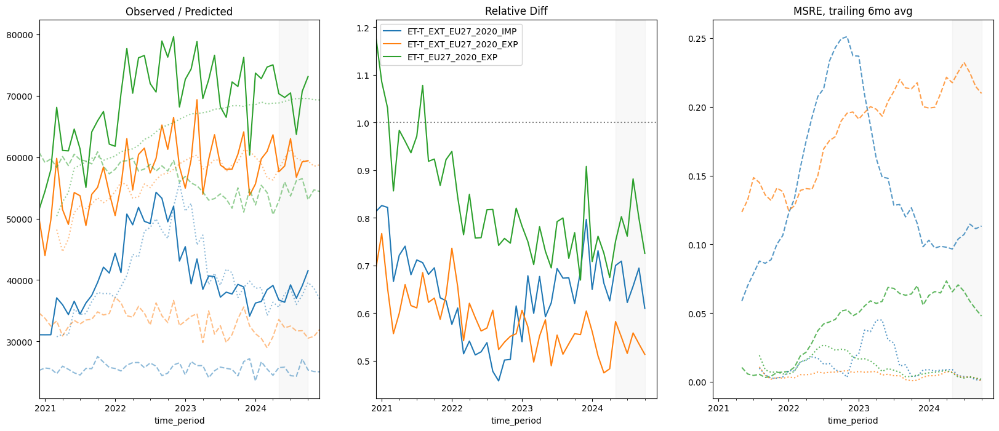

DK


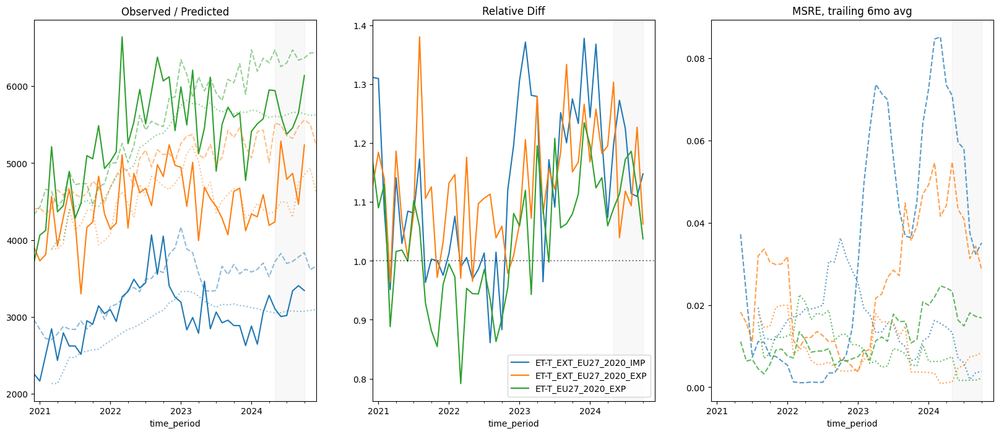

EE


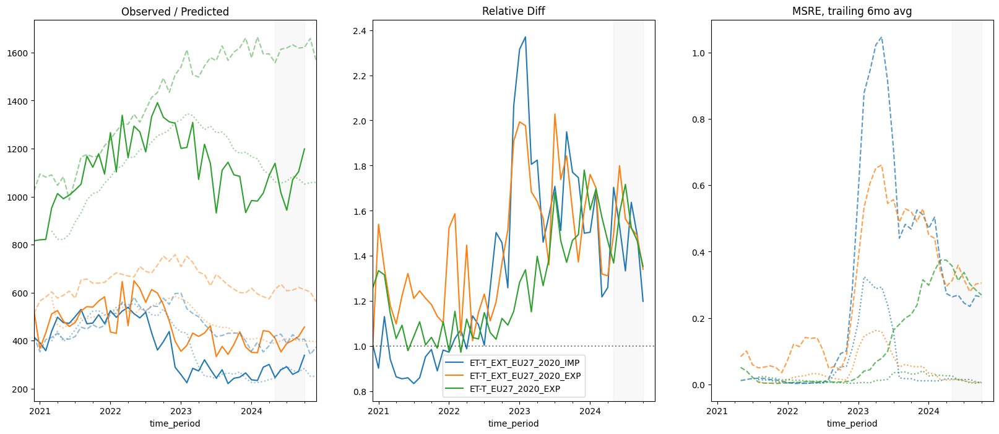

EL


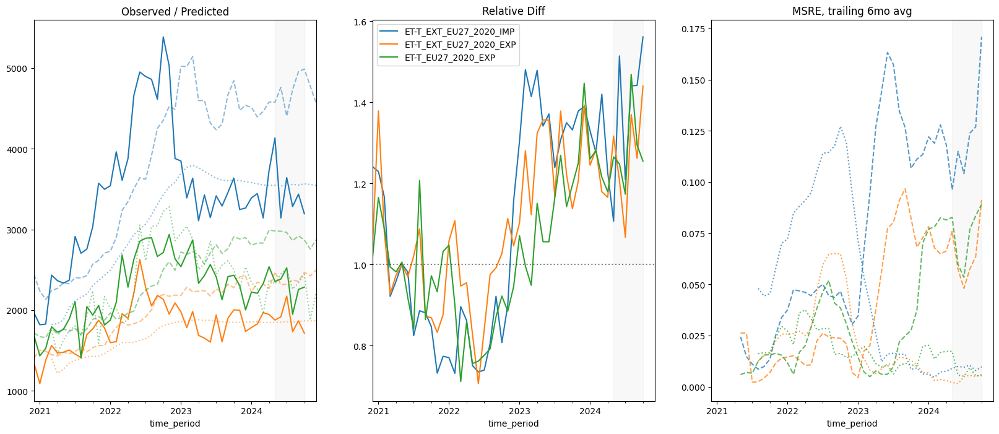

ES


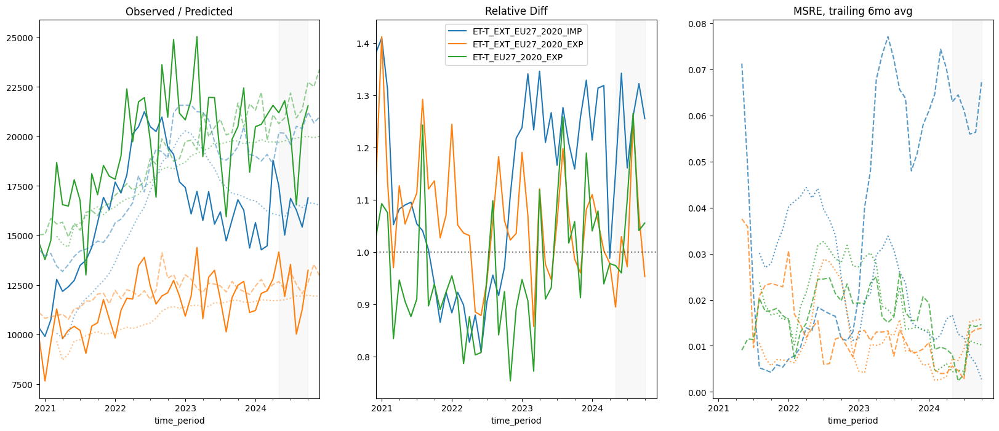

FI


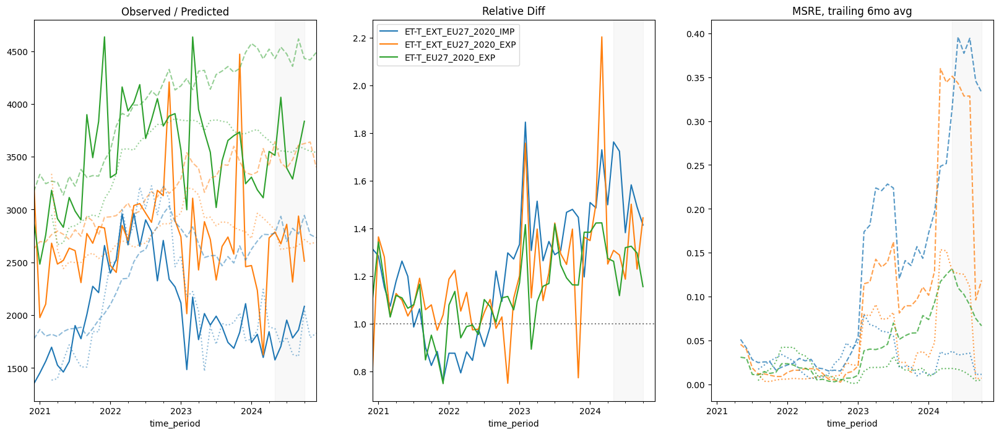

FR


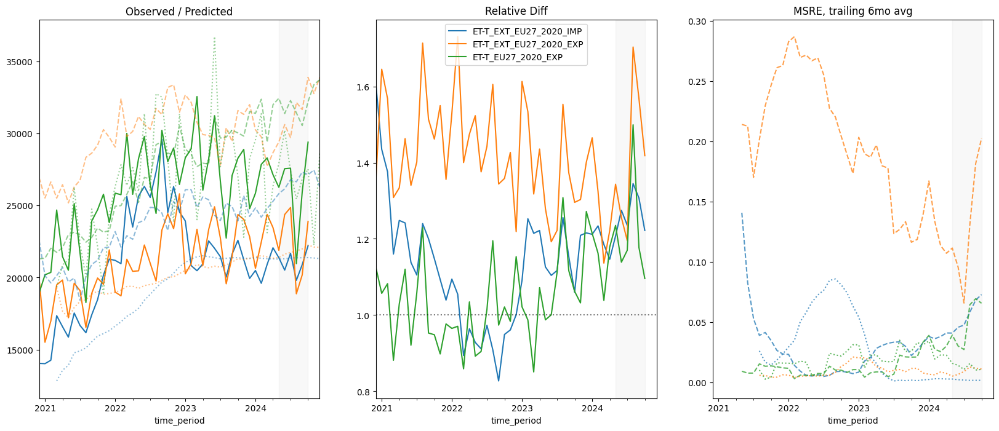

HR


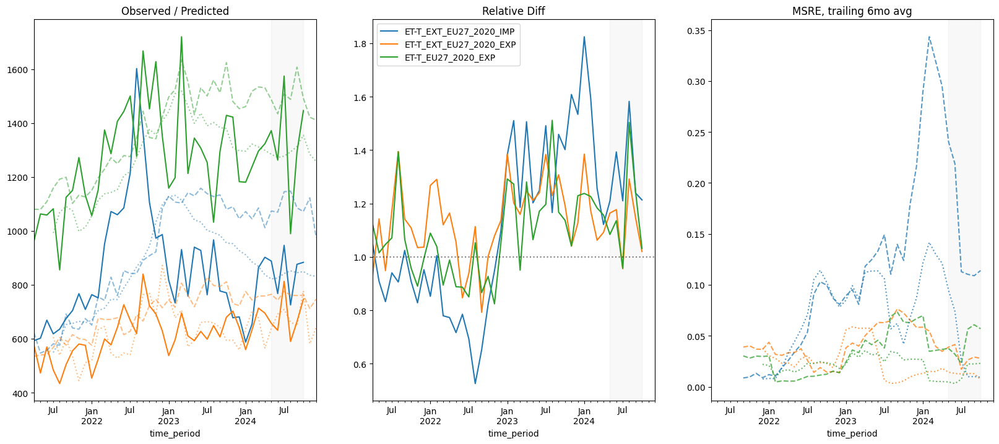

HU


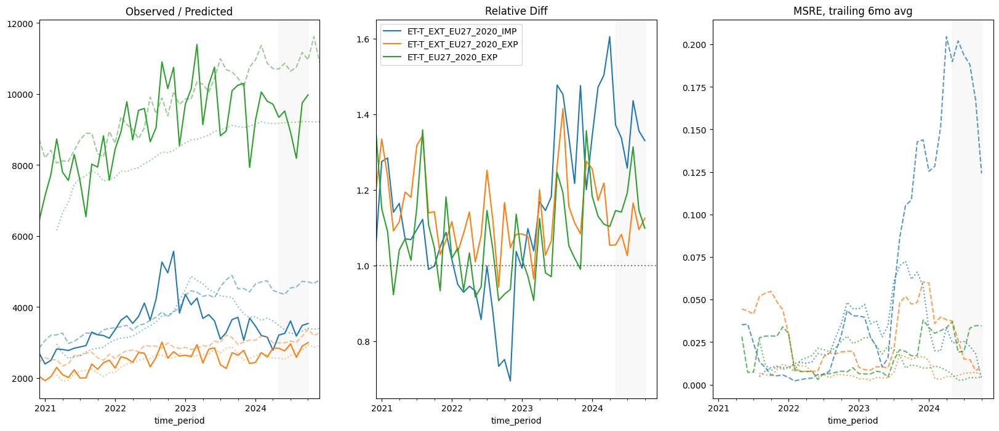

IE


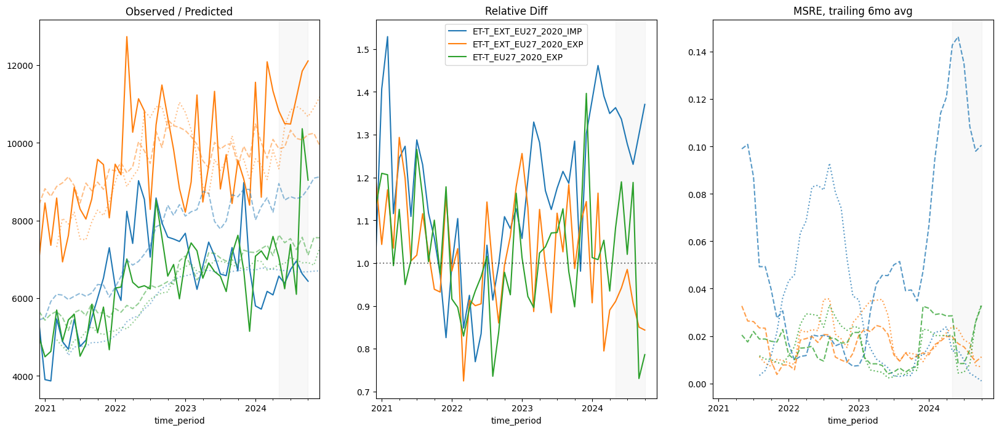

IT


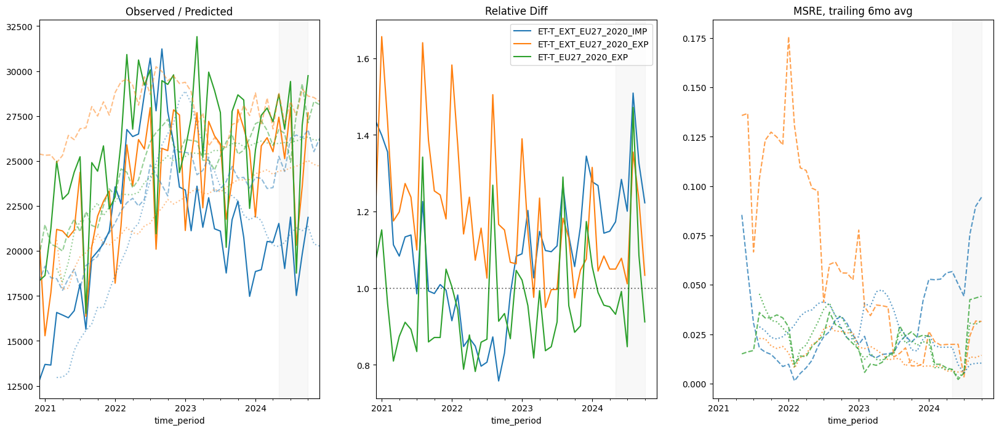

LT


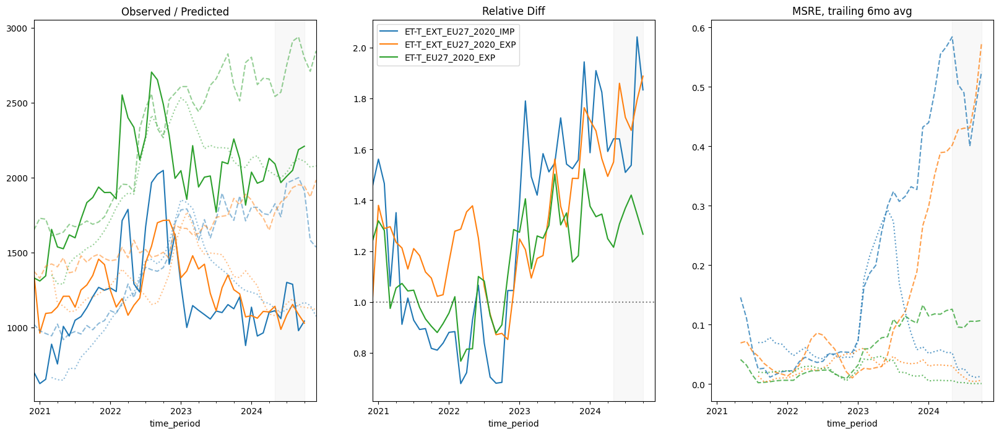

LU


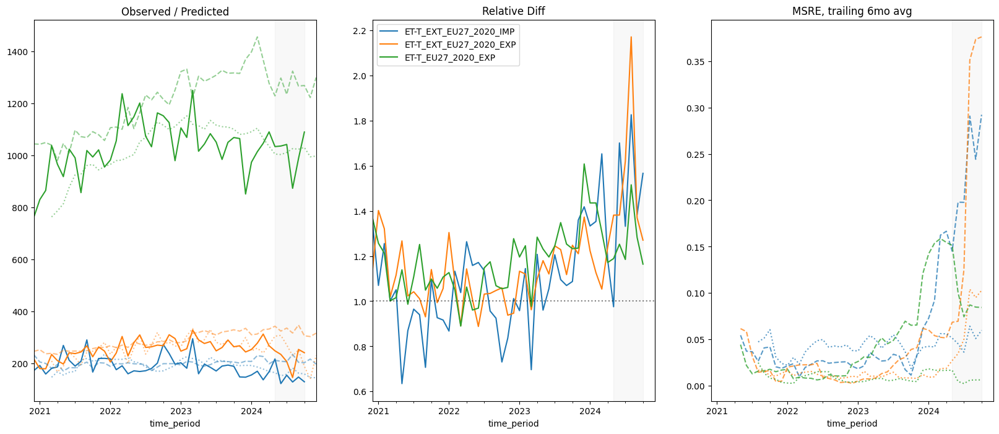

LV


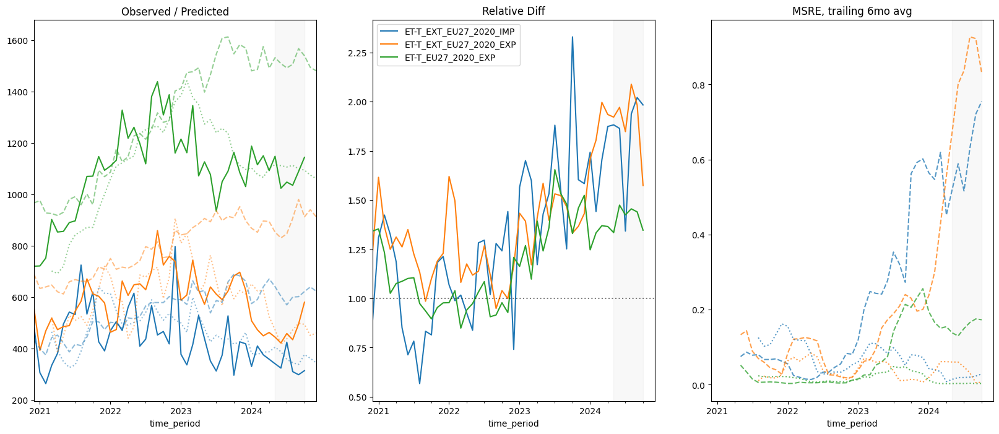

MT


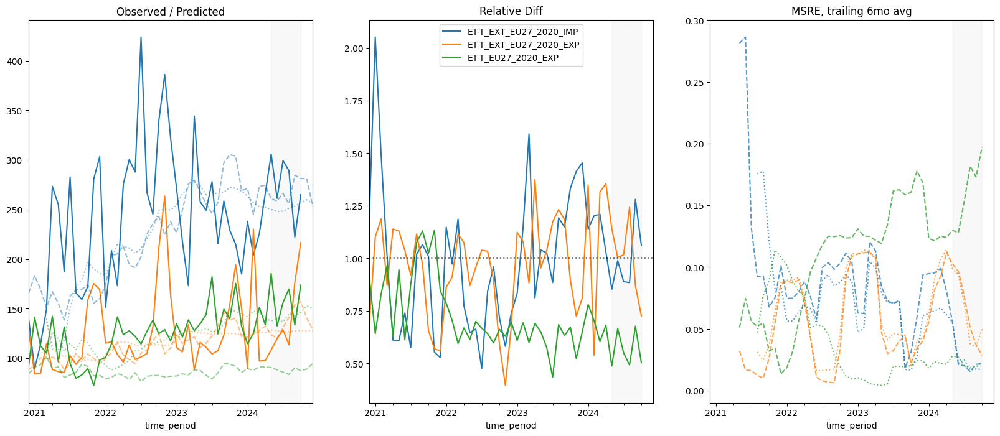

NL


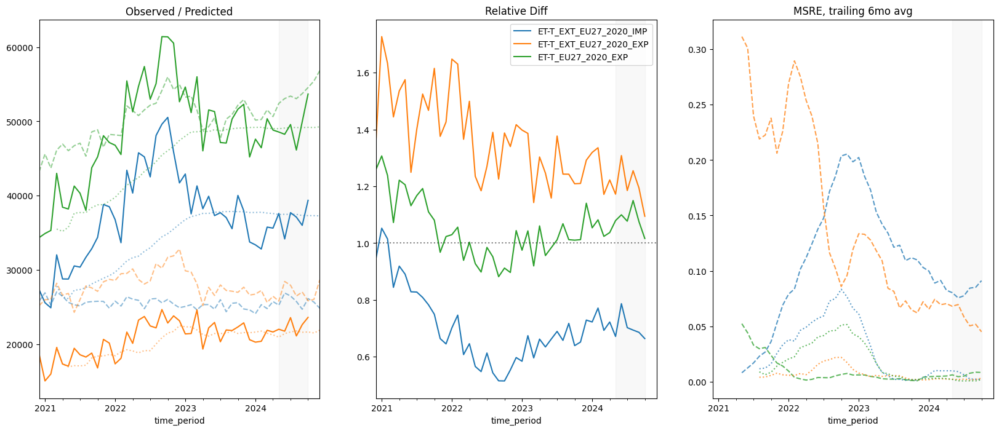

PL


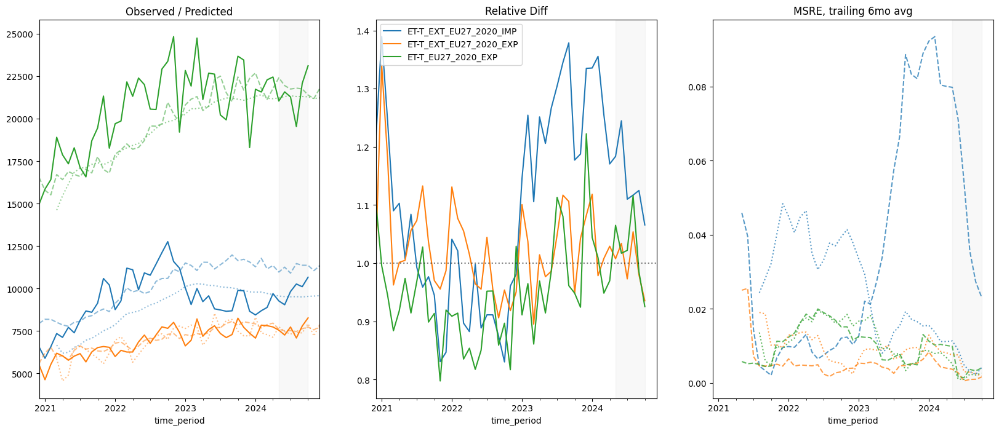

PT


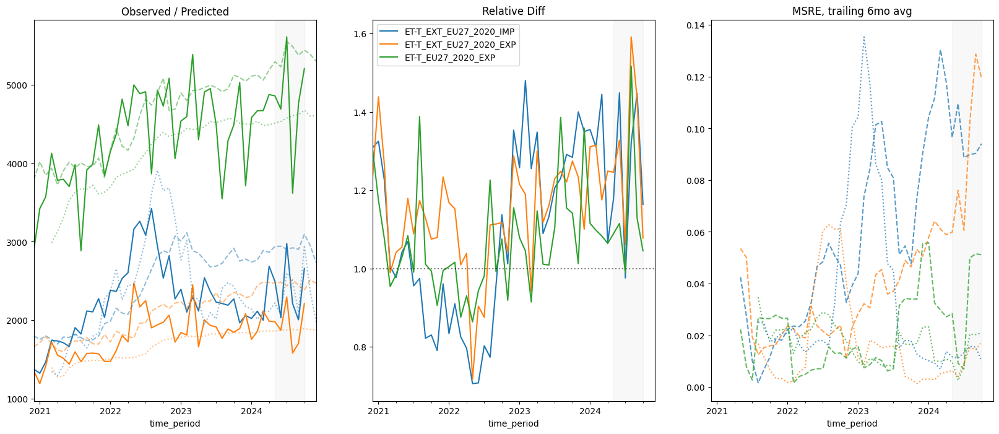

RO


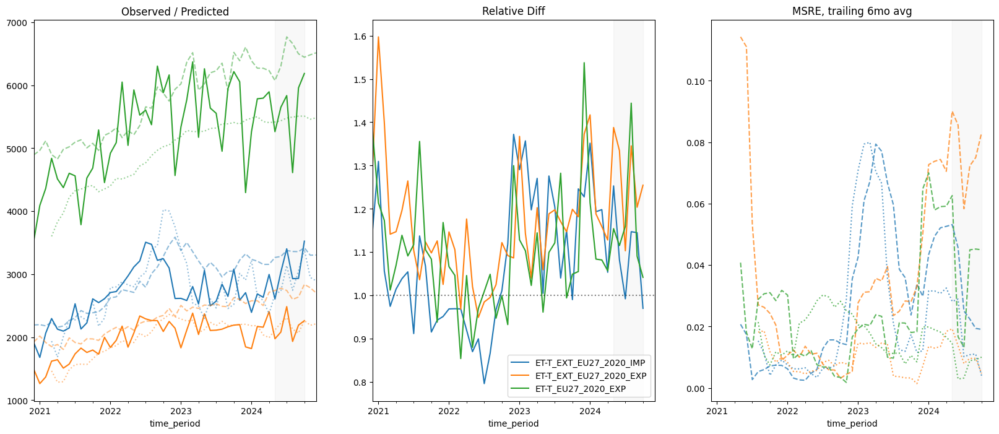

SE


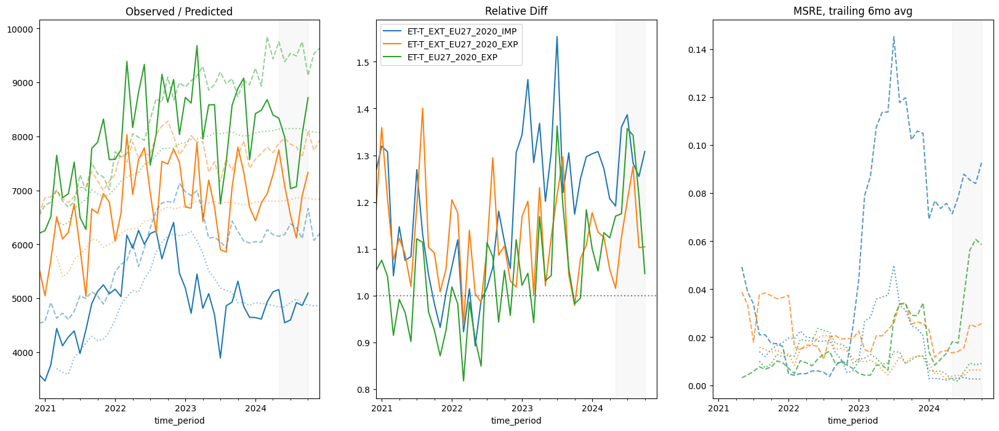

SI


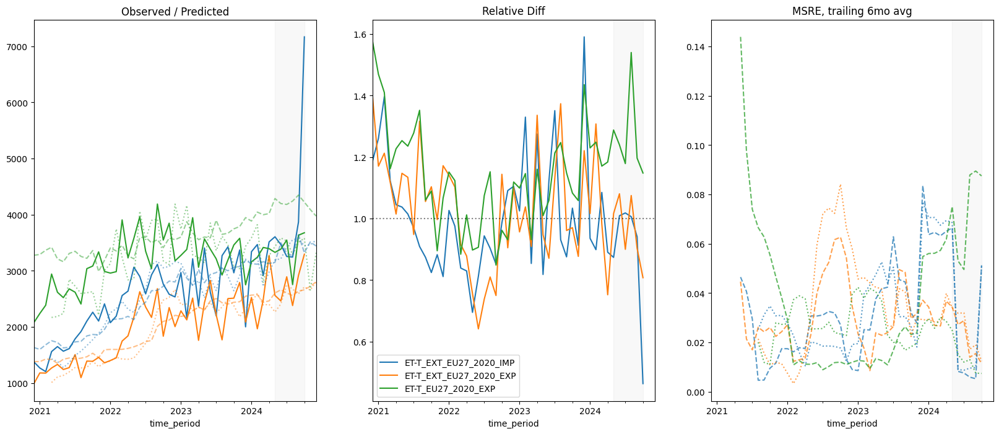

SK


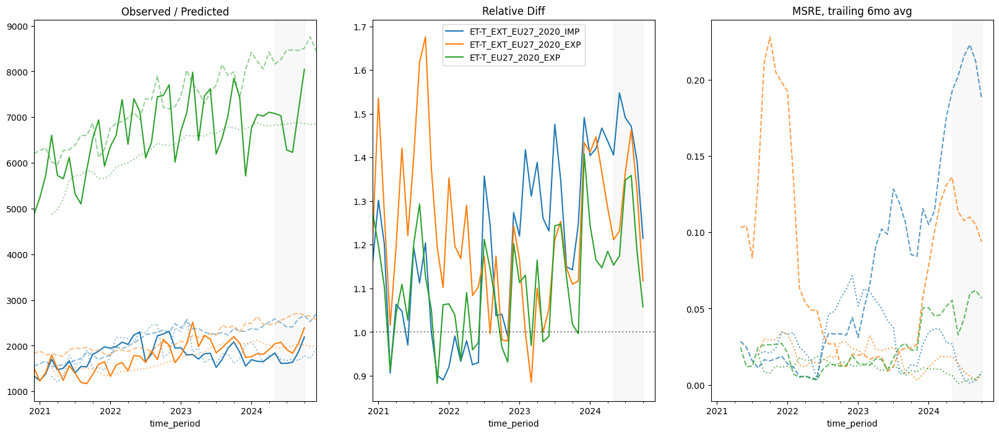

In [389]:
run_id = 60
# time_horizon = 3
n_months = 6

df_temp = new_big_pred_df.loc[run_id]
df_temp = df_temp[df_temp['time_horizon'] == th].droplevel(1)

for country in df_temp.index.get_level_values(0).unique():
    print(country)
    figg, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(20, 8))

    # plot targets and raw preds
    df_temp.loc[country]['target'].plot(ax=ax0, legend=False, title='Observed / Predicted')
    ax0.set_prop_cycle(None)    
    df_temp.loc[country]['pred'].plot(ax=ax0, linestyle='--', alpha=.5, legend=False)
    ax0.set_prop_cycle(None)    
    df_temp.loc[country]['adj_pred'].plot(ax=ax0, linestyle=':', alpha=.5, legend=False)
    
    # plot relative diff
    df_temp.loc[country]['rel_diff'].plot(ax=ax1, title='Relative Diff')
    ax1.axhline(1, color='black', linestyle=':', alpha=.5)

    # plot msre
    df_temp.loc[country]['msre_raw'].rolling(6).mean().plot(ax=ax2, linestyle='--', alpha=.75, title='MSRE, trailing 6mo avg', legend=False)
    ax2.set_prop_cycle(None) 
    df_temp.loc[country]['msre_adj'].rolling(6).mean().plot(ax=ax2, linestyle=':', alpha=.75, legend=False)

    # transparent vertical bars to indicate the last 6 months

    
    for ax in [ax0, ax1, ax2]:
        ax.axvspan(df_temp.loc[country].index[-n_months-2], df_temp.loc[country].index[-1-2], color='gray', alpha=.05)
    
    plt.show()
    # break

## note:
- the ewm smoothing method is fit _per-target_ and the best performance is rated based on the smallest average RMSE for the most recent **six** months
- this means that when you eyeball the charts above, it's perfectly reasonable that the adjusted preds, when projected all the way to the beginning of the TS, drifts dramatically from the target. focus on the part in the grey box, this is the part where we fit the ewm param to use for the final prediction
- it also explains why **some** adjusted preds are super smooth and **some** match the shape of the target (and original prediction) quite well. in the latter case, it's because the original pred fit the target quite well (or at least its shape), so not much smoothing occurs. in situations where the shape isn't well fit, the smoothing is more dramatic, and we see something closer to just the trailing mean of the target

msre_adj                                          
       ET-T_EXT_EU27_2020_IMP ET-T_EXT_EU27_2020_EXP ET-T_EU27_2020_EXP
run_id                                                                 
34                   0.011624               0.025973           0.009634
58                   0.011286               0.015320           0.011204
59                   0.013597               0.014836           0.008716
60                   0.011038               0.013433           0.010655

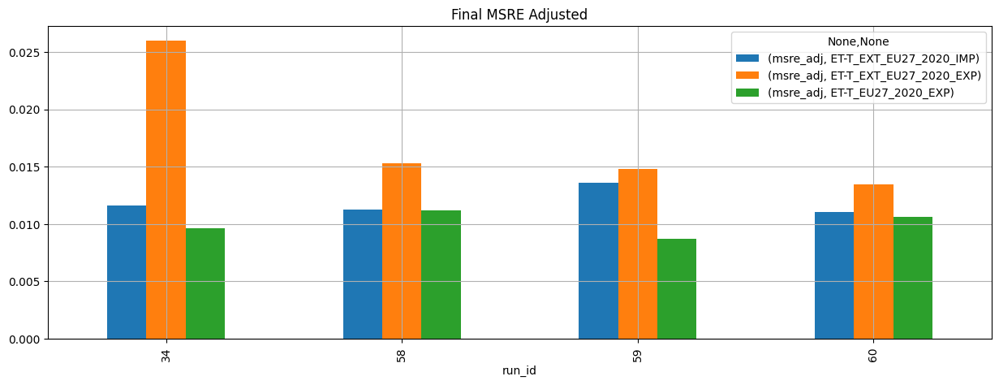

In [391]:
(new_big_pred_df[['msre_adj']].dropna().groupby(['run_id','geo']).tail(6).groupby(['run_id','geo']).mean().groupby('run_id').sum() / 27).plot.bar(figsize=(15,5), title='Final MSRE Adjusted', grid=True)   
(new_big_pred_df[['msre_adj']].dropna().groupby(['run_id','geo']).tail(6).groupby(['run_id','geo']).mean().groupby('run_id').sum() / 27)

In [392]:
gb = new_big_pred_df[['msre_raw','msre_adj']].dropna().groupby(['run_id','geo']).tail(6).groupby(['run_id','geo']).mean()#.groupby('run_id').sum() / 27
# 
# use_adj looks for instances where the raw msre is greater than the adjusted msre
use_adj = gb['msre_raw'] > gb['msre_adj']
use_adj.groupby('run_id').sum() / 27

use_adj.loc[run_id]

,ET-T_EXT_EU27_2020_IMP,ET-T_EXT_EU27_2020_EXP,ET-T_EU27_2020_EXP
geo,,,
AT,True,True,True
BE,True,True,True
BG,True,True,True
CY,False,True,True
CZ,True,True,True
DE,True,True,True
DK,True,True,True
EE,True,True,True
EL,True,True,True


# prep the submission
- choose run id
- save the output json, and copy it over to the euro stat repo, placing it in the correct folder for the month
- run the submission script!

In [379]:
final_run_id = 58

final_pred = new_big_pred_df.loc[final_run_id]
final_pred = final_pred[final_pred.index.get_level_values(2) == '2024-12-01']
final_pred = final_pred[final_pred['time_horizon'] == 3]

final_pred_final = final_pred['pred'].where(~use_adj.loc[final_run_id].values, final_pred['adj_pred'])
final_pred_final

,,,ET-T_EXT_EU27_2020_IMP,ET-T_EXT_EU27_2020_EXP,ET-T_EU27_2020_EXP
geo,start_time,time_period,,,
AT,2021-10-01,2024-12-01,3531.901250,5148.871800,11420.807125
BE,2021-10-01,2024-12-01,15635.888221,13456.977100,28864.302903
BG,2021-10-01,2024-12-01,1814.808842,1292.592380,2343.182209
CY,2021-10-01,2024-12-01,392.011004,338.030579,91.836881
CZ,2021-10-01,2024-12-01,5105.080345,3741.473911,15444.344004
DE,2021-10-01,2024-12-01,38860.733429,60415.595343,69556.337808
DK,2021-10-01,2024-12-01,3173.377673,4724.144529,5963.717880
EE,2021-10-01,2024-12-01,418.809871,415.893774,1086.134570
EL,2021-10-01,2024-12-01,3664.682034,1868.970142,2422.073843


In [380]:
for col in final_pred_final.columns:
    print(col)
    print(json.dumps(final_pred_final[col].droplevel([1,2]).to_dict(), indent=2)
    )
    print()

ET-T_EXT_EU27_2020_IMP
{
  "AT": 3531.9012503207728,
  "BE": 15635.888220752875,
  "BG": 1814.808842313408,
  "CY": 392.0110035985634,
  "CZ": 5105.080345180238,
  "DE": 38860.73342919841,
  "DK": 3173.377672847287,
  "EE": 418.8098709670931,
  "EL": 3664.682034205152,
  "ES": 15875.669981400017,
  "FI": 1781.0639394025375,
  "FR": 21455.532308952537,
  "HR": 823.5762301029791,
  "HU": 3591.0095645941124,
  "IE": 6801.067380716161,
  "IT": 20108.5627906741,
  "LT": 1118.4631830795531,
  "LU": 163.808510217071,
  "LV": 359.31497862300506,
  "MT": 270.39813642573927,
  "NL": 36325.44494125628,
  "PL": 10125.128654152244,
  "PT": 2158.6839534869914,
  "RO": 3179.0783576584936,
  "SE": 4683.254173640761,
  "SI": 3530.8821321445157,
  "SK": 1800.2185426460585
}

ET-T_EXT_EU27_2020_EXP
{
  "AT": 5148.871799630257,
  "BE": 13456.977100369028,
  "BG": 1292.592380448942,
  "CY": 338.03057861328125,
  "CZ": 3741.473910513007,
  "DE": 60415.59534301369,
  "DK": 4724.144528893001,
  "EE": 415.8937

In [ ]:
# 

In [386]:
# drop second and third index level
target_folder_map = {
    'ET-T_EU27_2020_EXP': 'intra_exp',
    'ET-T_EXT_EU27_2020_EXP': 'extra_exp',
    'ET-T_EXT_EU27_2020_IMP': 'extra_imp',
}

output = final_pred_final.droplevel([1,2])
output.columns = [target_folder_map[col] for col in output.columns]

# save the output to a json file
with open('output.json', 'w') as f:
    f.write(json.dumps(output.to_dict(), indent=2))


# NOTES / TO DO:
- can you do country-level normalization? passing scalers in right now only benefits the eval step, but we dont really look at that anyway
- can you do the expanded prediction step directly during train going forward?, 
    - yes, do this!
- how to alilgn evaluation across runs with essentially different test sets?
    - if you switch to predictions instead of test evals, you'll get up to current date. then you can see whose doing the best across the same timefreame
- 

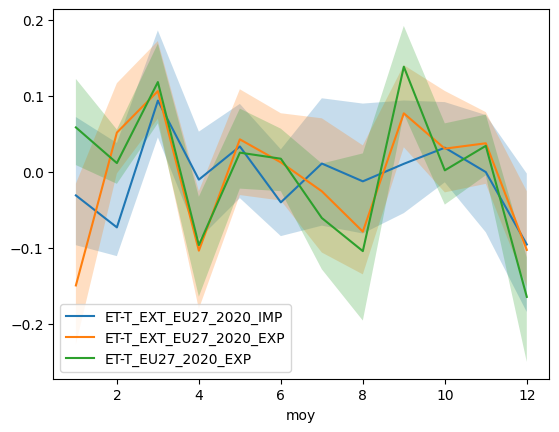

In [ ]:
df_temp['moy'] = df_temp.index.get_level_values(1).month.values
diffs = df_temp.groupby('geo')['target'].apply(lambda x: (x - x.shift()) / x).reset_index(level=0, drop=True)
diffs
yo = add_multi_to_df(df_temp, diffs, 'target_diff')
yo = yo[['moy','target_diff']].dropna()
yo = yo.groupby('moy')['target_diff'].describe().droplevel(0, axis=1)

cols = ['ET-T_EXT_EU27_2020_IMP', 'ET-T_EXT_EU27_2020_EXP','ET-T_EU27_2020_EXP']
for col in cols:
    yo[col]['mean'].plot(label=col)
    plt.fill_between(yo.index, yo[col]['25%'], yo[col]['75%'], alpha=.25)
plt.legend()

In [ ]:
yo.groupby('moy')['target_diff'].describe()

target_diff                                                    \
    ET-T_EXT_EU27_2020_IMP                                                     
                     count      mean       std       min       25%       50%   
moy                                                                            
1                    107.0 -0.030974  0.216107 -1.113792 -0.096574 -0.007186   
2                    107.0 -0.073098  0.422301 -4.200521 -0.110964 -0.027337   
3                    107.0  0.093904  0.157373 -0.892468  0.045446  0.104105   
4                    107.0 -0.010162  0.159489 -0.840922 -0.088486 -0.022625   
5                    108.0  0.033537  0.116032 -0.384675 -0.034525  0.032046   
6                    108.0 -0.040120  0.139700 -0.772431 -0.084609 -0.033384   
7                    108.0  0.011026  0.130595 -0.391828 -0.070840  0.017724   
8                    108.0 -0.012443  0.157915 -0.705492 -0.081162 -0.000167   
9                    108.0  0.010654  0.124331 -0.357317 -0.054318  0.033946   
10                   108.0  0.031887  0.153711 -0.779655 -0.013750  0.051566   
11                    81.0 -0.000233  0.146458 -0.453862 -0.079585  0.003500   
12                    81.0 -0.095626  0.181110 -0.717303 -0.184637 -0.050295   

                                                          ...            \
                        ET-T_EXT_EU27_2020_EXP            ...             
          75%       max                  count      mean  ...       75%   
moy                                                       ...             
1    0.072272  0.752212                  107.0 -0.149599  ... -0.015548   
2    0.038177  0.402461                  107.0  0.051795  ...  0.116882   
3    0.186384  0.386254                  107.0  0.106461  ...  0.172385   
4    0.053055  0.496658                  107.0 -0.103778  ... -0.025356   
5    0.089632  0.375499                  108.0  0.042874  ...  0.108847   
6    0.029719  0.338433                  108.0  0.012558  ...  0.077281   
7    0.097009  0.337226                  108.0 -0.025522  ...  0.070623   
8    0.090016  0.328217                  108.0 -0.078702  ...  0.034955   
9    0.094104  0.290163                  108.0  0.077157  ...  0.140643   
10   0.091956  0.460014                  108.0  0.030634  ...  0.106658   
11   0.074956  0.522977                   81.0  0.037717  ...  0.078777   
12  -0.002161  0.476095                   81.0 -0.102763  ... -0.025477   

                                                                          \
              ET-T_EU27_2020_EXP                                           
          max              count      mean       std       min       25%   
moy                                                                        
1    0.273747              107.0  0.058609  0.103443 -0.403368  0.009006   
2    0.610074              107.0  0.011625  0.064693 -0.256889 -0.015712   
3    0.351774              107.0  0.118364  0.079822 -0.067362  0.063994   
4    0.405352              107.0 -0.096500  0.111637 -0.418041 -0.164383   
5    0.385289              108.0  0.025364  0.094131 -0.477178 -0.022059   
6    0.321762              108.0  0.017367  0.083224 -0.398190 -0.025427   
7    0.549372              108.0 -0.060776  0.108543 -0.388186 -0.128347   
8    0.207947              108.0 -0.104381  0.186892 -0.753223 -0.195836   
9    0.424971              108.0  0.138578  0.101659 -0.271707  0.076634   
10   0.694020              108.0  0.002059  0.089586 -0.498145 -0.043061   
11   0.722129               81.0  0.034351  0.069765 -0.231087 -0.004431   
12   0.479212               81.0 -0.164677  0.120047 -0.461648 -0.250382   

                                   
                                   
          50%       75%       max  
moy                                
1    0.065244  0.122533  0.343706  
2    0.021419  0.055758  0.122224  
3    0.131826  0.168952  0.353008  
4   -0.108494 -0.032662  0.259832  
5    0.028029  0.083380  0.2